In [1]:
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt 
import seaborn as sns

## Data Ingestion

#### Reading the Dataset

In [2]:
df1 = pd.read_excel('Customer Churn Data.xlsx', sheet_name='Data for DSBA')

#### The problem statement is used to identify whether or not customers are going to churn and under which conditions. This would be done in order to increase the profitability of the DTH Service provider as they are loosing customers due to a noticeably high competition in the market

In [3]:
df1.head()

,AccountID,Churn,Tenure,City_Tier,CC_Contacted_LY,Payment,Gender,Service_Score,Account_user_count,account_segment,CC_Agent_Score,Marital_Status,rev_per_month,Complain_ly,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,cashback,Login_device
0,20000,1,4,3.0,6.0,Debit Card,Female,3.0,3,Super,2.0,Single,9,1.0,11,1,5,159.93,Mobile
1,20001,1,0,1.0,8.0,UPI,Male,3.0,4,Regular Plus,3.0,Single,7,1.0,15,0,0,120.9,Mobile
2,20002,1,0,1.0,30.0,Debit Card,Male,2.0,4,Regular Plus,3.0,Single,6,1.0,14,0,3,NaN,Mobile
3,20003,1,0,3.0,15.0,Debit Card,Male,2.0,4,Super,5.0,Single,8,0.0,23,0,3,134.07,Mobile
4,20004,1,0,1.0,12.0,Credit Card,Male,2.0,3,Regular Plus,5.0,Single,3,0.0,11,1,3,129.6,Mobile


#### From a very low level understandng it can be said that the dataset consists of 18 independent variable and a dependent variable or a class variable/ target variable "Churn". By going through the data set we can understand it is binary classification problem.

#### Determining the number of Rows and Columns

In [4]:
df1.shape

(11260, 19)

#### Information of Data

In [5]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11260 entries, 0 to 11259
Data columns (total 19 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   AccountID                11260 non-null  int64  
 1   Churn                    11260 non-null  int64  
 2   Tenure                   11158 non-null  object 
 3   City_Tier                11148 non-null  float64
 4   CC_Contacted_LY          11158 non-null  float64
 5   Payment                  11151 non-null  object 
 6   Gender                   11152 non-null  object 
 7   Service_Score            11162 non-null  float64
 8   Account_user_count       11148 non-null  object 
 9   account_segment          11163 non-null  object 
 10  CC_Agent_Score           11144 non-null  float64
 11  Marital_Status           11048 non-null  object 
 12  rev_per_month            11158 non-null  object 
 13  Complain_ly              10903 non-null  float64
 14  rev_growth_yoy        

#### The information of the dataset says that we have a couple of object variables including numinal and ordinal like...... payment..... etc which must be encoded in the later part of the analysis, as ML algorithm only understands data which are numerical in nature.

#### Description of the Dataset

In [6]:
df1.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
AccountID,11260,NaN,NaN,NaN,25629.5,3250.63,20000,22814.8,25629.5,28444.2,31259
Churn,11260,NaN,NaN,NaN,0.168384,0.374223,0,0,0,0,1
Tenure,11158,38,1,1351,NaN,NaN,NaN,NaN,NaN,NaN,NaN
City_Tier,11148,NaN,NaN,NaN,1.65393,0.915015,1,1,1,3,3
CC_Contacted_LY,11158,NaN,NaN,NaN,17.8671,8.85327,4,11,16,23,132
Payment,11151,5,Debit Card,4587,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Gender,11152,4,Male,6328,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Service_Score,11162,NaN,NaN,NaN,2.90253,0.725584,0,2,3,3,5
Account_user_count,11148,7,4,4569,NaN,NaN,NaN,NaN,NaN,NaN,NaN
account_segment,11163,7,Super,4062,NaN,NaN,NaN,NaN,NaN,NaN,NaN


#### The description of the data says a lot on the staistical point of view, from count we can understand not all the data are in their correct format either there is a presence of null values or some other undesired characters. Individually we can also analyse the std dev, and quartiles of the features present in the dataset

#### Understading the data distribution of class variable

In [7]:
df1.Churn.value_counts()

0    9364
1    1896
Name: Churn, dtype: int64

#### Value_counts() tells us the count of unique values from the feature, by applying value_counts() on churn we can say that the data isnt uniformly distributed in other words it is imbalanced. 

In [8]:
df1.Churn.value_counts()*100/len(df1)

0    83.161634
1    16.838366
Name: Churn, dtype: float64

#### Determining the values of the features having object data type

In [9]:
for feature in df1.columns:
    if df1[feature].dtype == 'object': 
        print(pd.DataFrame(df1[feature].value_counts()))
        print("\n")

    Tenure
1     1351
0     1231
8      519
9      496
7      450
10     423
3      410
4      403
5      403
11     388
6      363
12     360
13     359
2      354
14     345
15     311
16     291
19     273
18     253
20     217
17     215
21     170
23     169
22     151
24     147
30     137
28     137
99     131
27     131
26     122
#      116
29     114
25     114
31      96
50       2
51       2
60       2
61       2


                  Payment
Debit Card           4587
Credit Card          3511
E wallet             1217
Cash on Delivery     1014
UPI                   822


        Gender
Male      6328
Female    4178
M          376
F          270


   Account_user_count
4                4569
3                3261
5                1699
2                 526
1                 446
@                 332
6                 315


              account_segment
Super                    4062
Regular Plus             3862
HNI                      1639
Super Plus                771
Regula

#### Replacing unwanted values with NaN and converting the necessary variables from object to float

#### Lambda functions are useful in order to replace characters like #,%, etc with nan, after converting into nan and then we will impute these values using a suitable imputer.

In [10]:
df1["Tenure"] = df1["Tenure"].apply([lambda x: x.replace("#", np.nan)]) # Remove Sharp sign

In [11]:
df1["Tenure"] = df1["Tenure"].astype("float")

In [12]:
df1.Tenure.value_counts()

1.0     1351
0.0     1231
8.0      519
9.0      496
7.0      450
10.0     423
3.0      410
4.0      403
5.0      403
11.0     388
6.0      363
12.0     360
13.0     359
2.0      354
14.0     345
15.0     311
16.0     291
19.0     273
18.0     253
20.0     217
17.0     215
21.0     170
23.0     169
22.0     151
24.0     147
28.0     137
30.0     137
27.0     131
99.0     131
26.0     122
29.0     114
25.0     114
31.0      96
51.0       2
60.0       2
61.0       2
50.0       2
Name: Tenure, dtype: int64

In [13]:
df1["Gender"] = df1["Gender"].apply([lambda x: x.replace("Male", "M")]) # Remove dollar sign
df1["Gender"] = df1["Gender"].apply([lambda x: x.replace("Female", "F")])

In [14]:
df1.Gender.value_counts()

M    6704
F    4448
Name: Gender, dtype: int64

In [15]:
df1["Account_user_count"] = df1["Account_user_count"].apply([lambda x: x.replace("@", np.nan)]) # Remove @ sign

In [16]:
df1["Account_user_count"] = df1["Account_user_count"].astype("float")

In [17]:
df1.Account_user_count.value_counts()

4.0    4569
3.0    3261
5.0    1699
2.0     526
1.0     446
6.0     315
Name: Account_user_count, dtype: int64

In [18]:
df1["account_segment"] = df1["account_segment"].apply([lambda x: x.replace("Regular +", "Regular Plus")]) # Remove dollar sign
df1["account_segment"] = df1["account_segment"].apply([lambda x: x.replace("Super +", "Super Plus")])

In [19]:
df1.account_segment.value_counts()

Regular Plus    4124
Super           4062
HNI             1639
Super Plus       818
Regular          520
Name: account_segment, dtype: int64

In [20]:
df1["rev_per_month"] = df1["rev_per_month"].apply([lambda x: x.replace("+", np.nan)]) # Remove plus sign

In [21]:
df1["rev_per_month"] = df1["rev_per_month"].astype("float")

In [22]:
df1.rev_per_month.value_counts()

3.0      1746
2.0      1585
5.0      1337
4.0      1218
6.0      1085
7.0       754
8.0       643
9.0       564
10.0      413
1.0       402
11.0      278
12.0      166
13.0       93
14.0       48
15.0       24
102.0       8
123.0       5
107.0       5
124.0       5
118.0       4
133.0       4
136.0       4
129.0       4
140.0       4
101.0       3
115.0       3
116.0       3
127.0       3
108.0       3
117.0       3
130.0       3
138.0       3
119.0       3
126.0       3
137.0       3
113.0       3
110.0       3
105.0       2
114.0       2
19.0        2
139.0       2
134.0       2
131.0       2
121.0       2
22.0        2
120.0       2
125.0       2
103.0       1
23.0        1
100.0       1
109.0       1
21.0        1
20.0        1
111.0       1
122.0       1
104.0       1
25.0        1
135.0       1
Name: rev_per_month, dtype: int64

In [23]:
df1["rev_growth_yoy"] = df1["rev_growth_yoy"].apply([lambda x: x.replace("$", np.nan)]) # Remove plus sign

In [24]:
df1.rev_growth_yoy.value_counts()

14.0    1524
13.0    1427
15.0    1283
12.0    1210
16.0     949
18.0     708
17.0     704
19.0     619
20.0     562
11.0     523
21.0     433
22.0     403
23.0     345
24.0     229
25.0     188
26.0      98
27.0      35
28.0      14
4.0        3
Name: rev_growth_yoy, dtype: int64

In [25]:
# Remove sharp,dollar,star sign
df1["coupon_used_for_payment"] = df1["coupon_used_for_payment"].apply([lambda x: x.replace("$", np.nan)])
df1["coupon_used_for_payment"] = df1["coupon_used_for_payment"].apply([lambda x: x.replace("#", np.nan)])
df1["coupon_used_for_payment"] = df1["coupon_used_for_payment"].apply([lambda x: x.replace("*", np.nan)])

In [26]:
df1["coupon_used_for_payment"] = df1["coupon_used_for_payment"].astype("float")

In [27]:
df1["coupon_used_for_payment"].value_counts()

1.0     4373
2.0     2656
0.0     2150
3.0      698
4.0      424
5.0      284
6.0      234
7.0      184
8.0       88
10.0      34
9.0       34
11.0      30
12.0      26
13.0      22
14.0      12
16.0       4
15.0       4
Name: coupon_used_for_payment, dtype: int64

In [28]:
df1["Day_Since_CC_connect"] = df1["Day_Since_CC_connect"].apply([lambda x: x.replace("$", np.nan)]) #Remove dollar sign

In [29]:
df1["Day_Since_CC_connect"] = df1["Day_Since_CC_connect"].astype("float")

In [30]:
df1.Day_Since_CC_connect.value_counts()

3.0     1816
2.0     1574
1.0     1256
8.0     1169
0.0      964
7.0      911
4.0      893
9.0      622
5.0      479
10.0     339
6.0      229
11.0     183
12.0     146
13.0     117
14.0      74
15.0      37
17.0      34
16.0      26
18.0      26
31.0       2
30.0       2
47.0       2
46.0       1
Name: Day_Since_CC_connect, dtype: int64

In [31]:
df1["Login_device"] = df1["Login_device"].apply([lambda x: x.replace("&&&&", np.nan)]) # Remove plus sign

In [32]:
df1.Login_device.value_counts()

Mobile      7482
Computer    3018
Name: Login_device, dtype: int64

In [33]:
df1["cashback"] = df1["cashback"].apply([lambda x: x.replace("$", np.nan)]) # Remove dollar sign

In [34]:
df1["cashback"] = df1["cashback"].astype("float")

In [35]:
df1.cashback.value_counts()

155.62     10
145.08      9
149.68      9
152.28      9
154.73      9
           ..
154.23      1
182.94      1
1829.00     1
175.17      1
236.09      1
Name: cashback, Length: 5692, dtype: int64

#### Univariate Analysis on Certain Variables

#### A simple distribution of churn showing the values of 1 and 0 graphically

C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='Churn', ylabel='Density'>

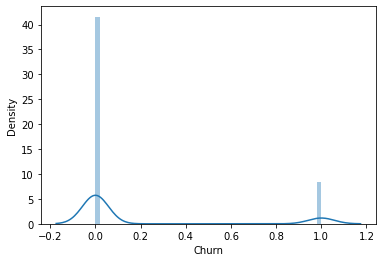

In [36]:
sns.distplot(df1['Churn'])

#### Plots for Numerical Variables

#### Determining skewness on specific variables

#### The KDE plot below tells us about how much distributed the data is, we are finding out for only a few specific variables. Clearly the data right skewed for rev_per_month and cashback and rev_growth_yoy shows a gaussian distribution in the beginning but still is slightly right skewed.

#### What does this imply? Skewness..

<AxesSubplot:xlabel='cashback', ylabel='Density'>

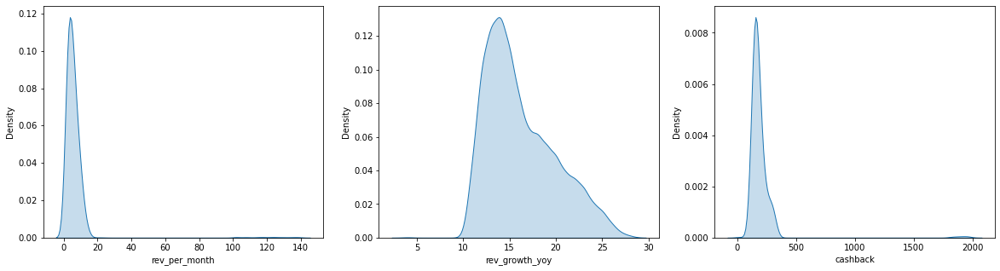

In [37]:
fig, axes = plt.subplots(1, 3, figsize=(20, 5))
sns.kdeplot('rev_per_month',data=df1, shade=True, ax = axes[0])
sns.kdeplot('rev_growth_yoy',data=df1, shade=True, ax = axes[1])
sns.kdeplot('cashback',data=df1, shade=True, ax = axes[2])

C:\Users\Admin\anaconda3\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
C:\Users\Admin\anaconda3\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
C:\Users\Admin\anaconda3\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


<AxesSubplot:xlabel='cashback'>

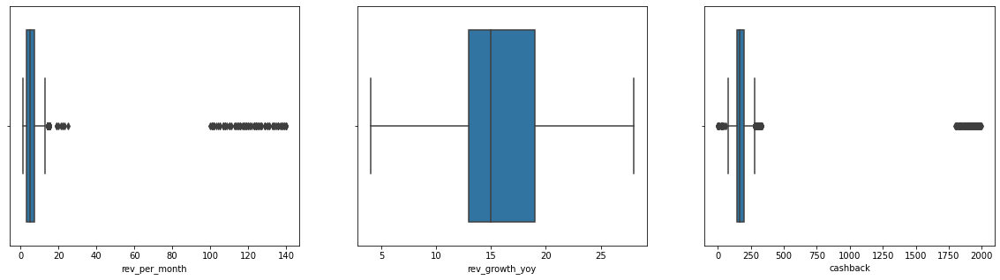

In [38]:
fig, axes = plt.subplots(1, 3, figsize=(20, 5))
sns.boxplot('rev_per_month',data=df1, ax = axes[0])
sns.boxplot('rev_growth_yoy',data=df1, ax = axes[1])
sns.boxplot('cashback',data=df1, ax = axes[2])

#### Plots for Categorical Variables

C:\Users\Admin\anaconda3\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
C:\Users\Admin\anaconda3\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
C:\Users\Admin\anaconda3\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
C:\Users\Admin\anaconda3\lib\site-

<AxesSubplot:xlabel='City_Tier', ylabel='count'>

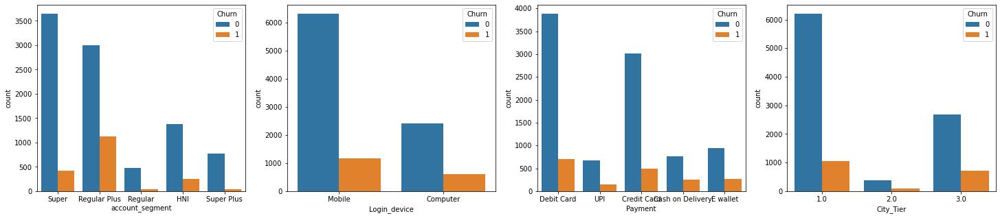

In [39]:
fig, axes = plt.subplots(1, 4, figsize=(25, 5))
sns.countplot('account_segment',data=df1, ax = axes[0], hue = df1.Churn)
sns.countplot('Login_device',data=df1, ax = axes[1], hue = df1.Churn)
sns.countplot('Payment',data=df1, ax = axes[2], hue = df1.Churn)
sns.countplot('City_Tier',data=df1, ax = axes[3], hue = df1.Churn)

#### account_segment - Regular Plus  (most likely) has churned
#### login_device - Customers using Mobile phones (most likely) has churned
#### payment - Debit card holders (most likely) has churned
#### login_device - Customers in Tier - 1 cities (most likely) has churned

#### Bivariate Analysis

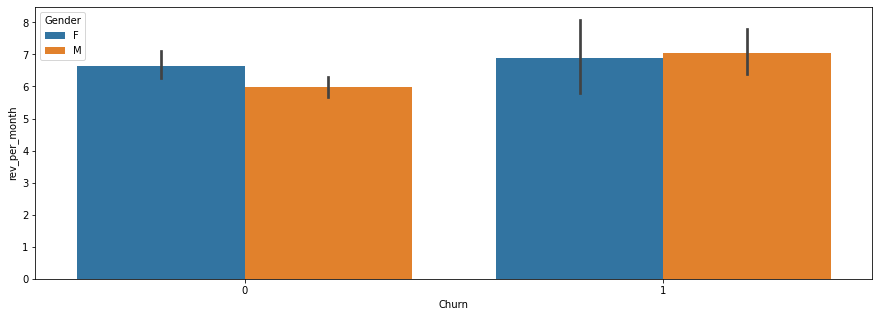

In [40]:
plt.figure(figsize=(15,5))
sns.barplot(data=df1,x='Churn',y='rev_per_month',hue='Gender')
plt.show()

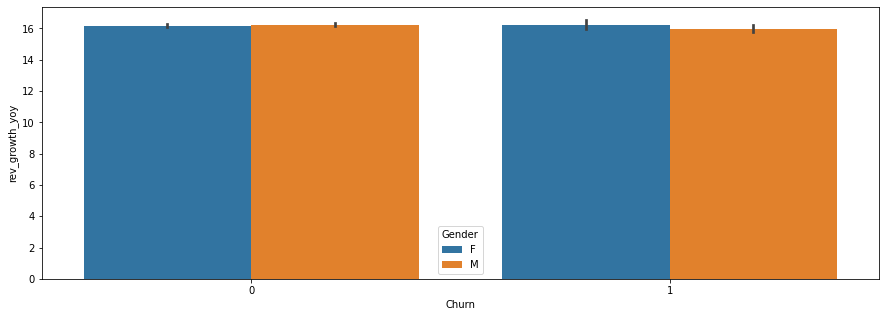

In [41]:
plt.figure(figsize=(15,5))
sns.barplot(data=df1,x='Churn',y='rev_growth_yoy',hue='Gender')
plt.show()

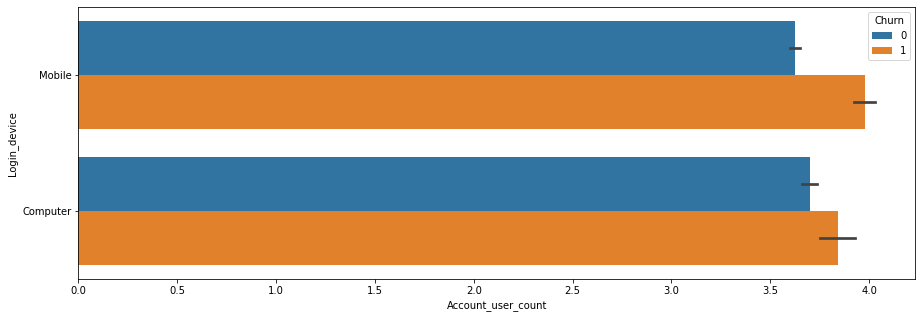

In [42]:
plt.figure(figsize=(15,5))
sns.barplot(data=df1,x='Account_user_count',y='Login_device', hue = 'Churn')
plt.show()

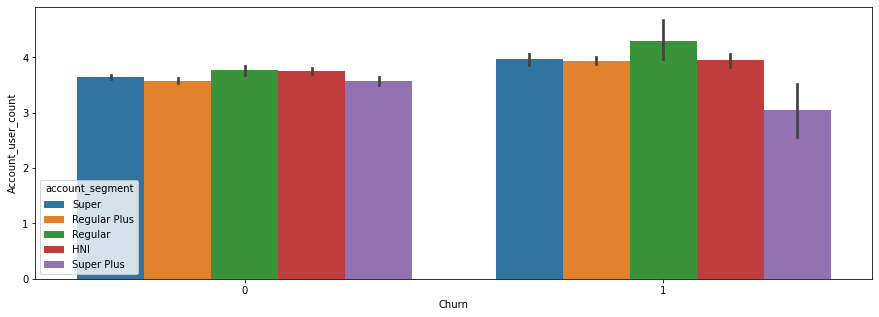

In [43]:
plt.figure(figsize=(15,5))
sns.barplot(data=df1, x='Churn', y='Account_user_count', hue='account_segment')
plt.show()

<AxesSubplot:xlabel='Tenure', ylabel='CC_Contacted_LY'>

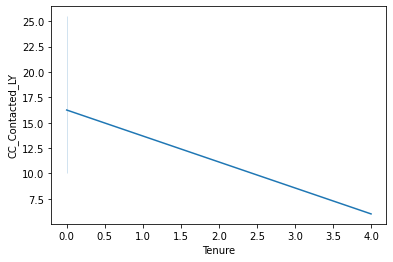

In [44]:
sns.lineplot(x='Tenure',y='CC_Contacted_LY', data=df1.head() )

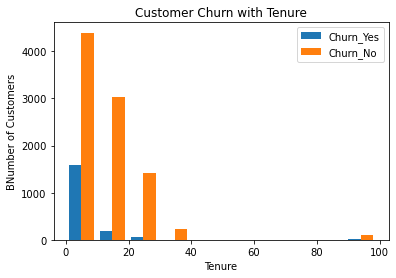

In [45]:
tenure_churn_no = df1[df1.Churn == 0].Tenure
tenure_churn_yes = df1[df1.Churn == 1].Tenure

plt.xlabel("Tenure")
plt.ylabel("BNumber of Customers")
plt.title("Customer Churn with Tenure")

plt.hist([tenure_churn_yes, tenure_churn_no], label=['Churn_Yes','Churn_No'])
plt.legend()

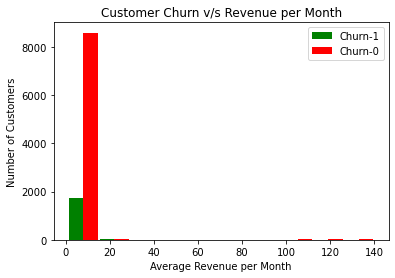

In [46]:
avrev_churn_no = df1[df1.Churn == 0].rev_per_month
avrev_churn_yes = df1[df1.Churn == 1].rev_per_month

plt.xlabel("Average Revenue per Month")
plt.ylabel("Number of Customers")
plt.title("Customer Churn v/s Revenue per Month")

plt.hist([avrev_churn_yes,avrev_churn_no], rwidth=0.95, color=['green','red'],label=['Churn-1','Churn-0'])
plt.legend()

<AxesSubplot:>

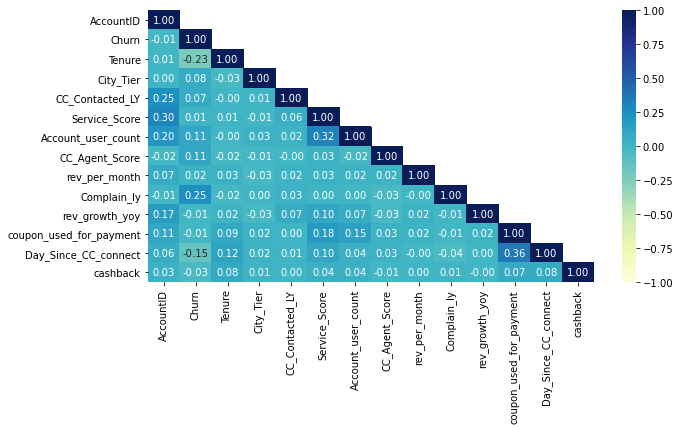

In [47]:
plt.figure(figsize=(10,5))
sns.heatmap(df1.corr(), annot=True, fmt='.2f', cmap='YlGnBu', vmin=-1, vmax=1, mask=np.triu(df1.corr(),+1) )

#### None of the features are showing significant correlationship with target variable as a result it might be difficult to achieve good performance of the model built

#### Checking the data types

In [48]:
df1.dtypes

AccountID                    int64
Churn                        int64
Tenure                     float64
City_Tier                  float64
CC_Contacted_LY            float64
Payment                     object
Gender                      object
Service_Score              float64
Account_user_count         float64
account_segment             object
CC_Agent_Score             float64
Marital_Status              object
rev_per_month              float64
Complain_ly                float64
rev_growth_yoy             float64
coupon_used_for_payment    float64
Day_Since_CC_connect       float64
cashback                   float64
Login_device                object
dtype: object

In [49]:
df1.head()

,AccountID,Churn,Tenure,City_Tier,CC_Contacted_LY,Payment,Gender,Service_Score,Account_user_count,account_segment,CC_Agent_Score,Marital_Status,rev_per_month,Complain_ly,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,cashback,Login_device
0,20000,1,4.0,3.0,6.0,Debit Card,F,3.0,3.0,Super,2.0,Single,9.0,1.0,11.0,1.0,5.0,159.93,Mobile
1,20001,1,0.0,1.0,8.0,UPI,M,3.0,4.0,Regular Plus,3.0,Single,7.0,1.0,15.0,0.0,0.0,120.90,Mobile
2,20002,1,0.0,1.0,30.0,Debit Card,M,2.0,4.0,Regular Plus,3.0,Single,6.0,1.0,14.0,0.0,3.0,NaN,Mobile
3,20003,1,0.0,3.0,15.0,Debit Card,M,2.0,4.0,Super,5.0,Single,8.0,0.0,23.0,0.0,3.0,134.07,Mobile
4,20004,1,0.0,1.0,12.0,Credit Card,M,2.0,3.0,Regular Plus,5.0,Single,3.0,0.0,11.0,1.0,3.0,129.60,Mobile


#### Determining value_counts of ordinal variables

In [50]:
df1.City_Tier.value_counts()

1.0    7263
3.0    3405
2.0     480
Name: City_Tier, dtype: int64

In [51]:
df1.Service_Score.value_counts()

3.0    5490
2.0    3251
4.0    2331
1.0      77
0.0       8
5.0       5
Name: Service_Score, dtype: int64

In [52]:
df1.Account_user_count.value_counts()

4.0    4569
3.0    3261
5.0    1699
2.0     526
1.0     446
6.0     315
Name: Account_user_count, dtype: int64

In [53]:
df1.CC_Agent_Score.value_counts()

3.0    3360
1.0    2302
5.0    2191
4.0    2127
2.0    1164
Name: CC_Agent_Score, dtype: int64

In [54]:
df1.coupon_used_for_payment.value_counts()

1.0     4373
2.0     2656
0.0     2150
3.0      698
4.0      424
5.0      284
6.0      234
7.0      184
8.0       88
10.0      34
9.0       34
11.0      30
12.0      26
13.0      22
14.0      12
16.0       4
15.0       4
Name: coupon_used_for_payment, dtype: int64

#### Dropping Unwanted Columns: AccountID column

In [55]:
df1.drop(["AccountID"],axis = 'columns', inplace = True)

#### Checking for Duplicated Values

In [56]:
dups = df1.duplicated()
print('Number of duplicate rows = %d' % (dups.sum()))
df1[dups]

Number of duplicate rows = 264


,Churn,Tenure,City_Tier,CC_Contacted_LY,Payment,Gender,Service_Score,Account_user_count,account_segment,CC_Agent_Score,Marital_Status,rev_per_month,Complain_ly,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,cashback,Login_device
1347,1,0.0,1.0,8.0,UPI,M,3.0,4.0,Regular Plus,3.0,Single,7.0,1.0,15.0,0.0,0.0,120.90,Mobile
1395,1,11.0,1.0,6.0,Debit Card,M,3.0,4.0,HNI,3.0,Single,10.0,1.0,13.0,0.0,0.0,153.81,Mobile
1456,1,0.0,1.0,13.0,Debit Card,M,3.0,5.0,Super,3.0,Single,2.0,1.0,24.0,1.0,6.0,160.74,Computer
1485,1,0.0,1.0,15.0,Credit Card,F,2.0,3.0,Regular Plus,5.0,Single,8.0,0.0,22.0,1.0,4.0,142.00,Mobile
1498,0,18.0,1.0,15.0,Debit Card,M,2.0,3.0,Super,4.0,Married,9.0,0.0,18.0,1.0,15.0,123.48,Mobile
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5584,0,9.0,1.0,16.0,Credit Card,M,3.0,4.0,Super,3.0,Single,3.0,0.0,20.0,1.0,9.0,175.98,Mobile
5604,1,20.0,1.0,14.0,Cash on Delivery,M,4.0,4.0,Regular Plus,3.0,Married,10.0,0.0,12.0,7.0,9.0,148.39,Mobile
5605,0,15.0,1.0,35.0,Debit Card,F,3.0,5.0,Super Plus,4.0,Married,2.0,0.0,24.0,2.0,11.0,260.70,Mobile
5611,0,12.0,3.0,17.0,Debit Card,F,4.0,4.0,Super,1.0,Married,3.0,0.0,12.0,1.0,10.0,178.43,Mobile


#### Dropping the Duplicates

In [57]:
df1.drop_duplicates(inplace= True)

#### Determining Missing Values

In [58]:
df1.isnull().sum().sum()

4360

In [59]:
df1_na = df1.isnull().sum()
df1_na[df1_na.values > 0].sort_values(ascending=False)

rev_per_month              791
Login_device               760
cashback                   473
Account_user_count         444
Day_Since_CC_connect       358
Complain_ly                357
Tenure                     218
Marital_Status             211
CC_Agent_Score             116
City_Tier                  112
Payment                    109
Gender                     108
CC_Contacted_LY            102
Service_Score               98
account_segment             97
rev_growth_yoy               3
coupon_used_for_payment      3
dtype: int64

In [60]:
df1.isnull().sum()*100/len(df1)

Churn                      0.000000
Tenure                     1.982539
City_Tier                  1.018552
CC_Contacted_LY            0.927610
Payment                    0.991270
Gender                     0.982175
Service_Score              0.891233
Account_user_count         4.037832
account_segment            0.882139
CC_Agent_Score             1.054929
Marital_Status             1.918880
rev_per_month              7.193525
Complain_ly                3.246635
rev_growth_yoy             0.027283
coupon_used_for_payment    0.027283
Day_Since_CC_connect       3.255729
cashback                   4.301564
Login_device               6.911604
dtype: float64

#### Treating Continuous Variables having missing values with Median

In [61]:
for column in df1.columns:
    if df1[column].dtype != 'object':
        median = df1[column].median()
        df1[column] = df1[column].fillna(median)    

df1.isnull().sum()

Churn                        0
Tenure                       0
City_Tier                    0
CC_Contacted_LY              0
Payment                    109
Gender                     108
Service_Score                0
Account_user_count           0
account_segment             97
CC_Agent_Score               0
Marital_Status             211
rev_per_month                0
Complain_ly                  0
rev_growth_yoy               0
coupon_used_for_payment      0
Day_Since_CC_connect         0
cashback                     0
Login_device               760
dtype: int64

#### Median is not sensitive to outliers hence used median to treat the data

#### Treating Categorical Variables having missing values with Mode

#### For categorical variable we caanot use mean or median for  imputing null mode comes into picture

In [62]:
for column in ['Payment', 'Gender', 'Marital_Status', 'Login_device', 'account_segment']:
    df1[column].fillna(df1[column].mode()[0], inplace=True)
    
df1.isnull().sum()

Churn                      0
Tenure                     0
City_Tier                  0
CC_Contacted_LY            0
Payment                    0
Gender                     0
Service_Score              0
Account_user_count         0
account_segment            0
CC_Agent_Score             0
Marital_Status             0
rev_per_month              0
Complain_ly                0
rev_growth_yoy             0
coupon_used_for_payment    0
Day_Since_CC_connect       0
cashback                   0
Login_device               0
dtype: int64

In [63]:
df1.describe(include='all')['Churn']

count     10996.000000
unique             NaN
top                NaN
freq               NaN
mean          0.168334
std           0.374180
min           0.000000
25%           0.000000
50%           0.000000
75%           0.000000
max           1.000000
Name: Churn, dtype: float64

#### Checking for Outliers

[Text(1, 0, 'Churn'),
 Text(2, 0, 'Tenure'),
 Text(3, 0, 'City_Tier'),
 Text(4, 0, 'CC_Contacted_LY'),
 Text(5, 0, 'Service_Score'),
 Text(6, 0, 'Account_user_count'),
 Text(7, 0, 'CC_Agent_Score'),
 Text(8, 0, 'rev_per_month'),
 Text(9, 0, 'Complain_ly'),
 Text(10, 0, 'rev_growth_yoy'),
 Text(11, 0, 'coupon_used_for_payment'),
 Text(12, 0, 'Day_Since_CC_connect'),
 Text(13, 0, 'cashback')]

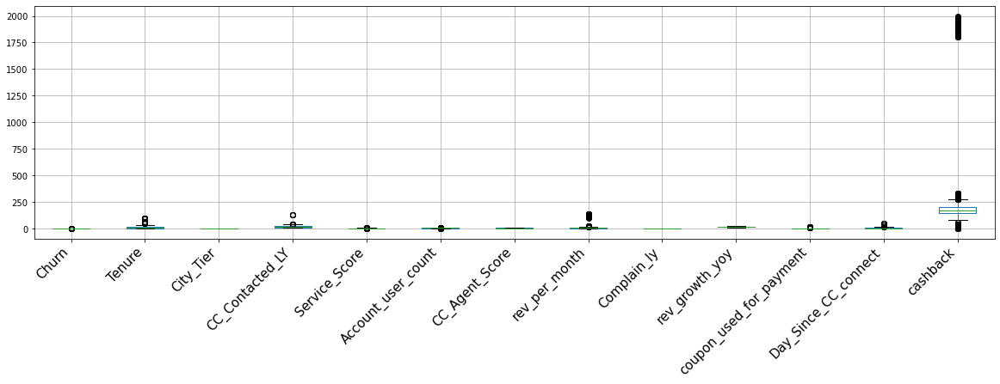

In [64]:
plt.figure(figsize=(20,5))
boxplot = df1.boxplot()
boxplot.set_xticklabels(boxplot.get_xticklabels(), rotation=45, horizontalalignment='right', fontsize=15)

#### Treating outliers only for required columns

In [65]:
def remove_outlier(col):
    sorted(col)
    Q1,Q3=np.percentile(col,[25,75])
    IQR=Q3-Q1
    lower_range= Q1-(1.5 * IQR)
    upper_range= Q3+(1.5 * IQR)
    return lower_range, upper_range

In [66]:
for column in ['rev_per_month','rev_growth_yoy','cashback']:
    lr,ur=remove_outlier(df1[column])
    df1[column]=np.where(df1[column]>ur,ur,df1[column])
    df1[column]=np.where(df1[column]<lr,lr,df1[column])

C:\Users\Admin\anaconda3\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
C:\Users\Admin\anaconda3\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
C:\Users\Admin\anaconda3\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


<AxesSubplot:xlabel='cashback'>

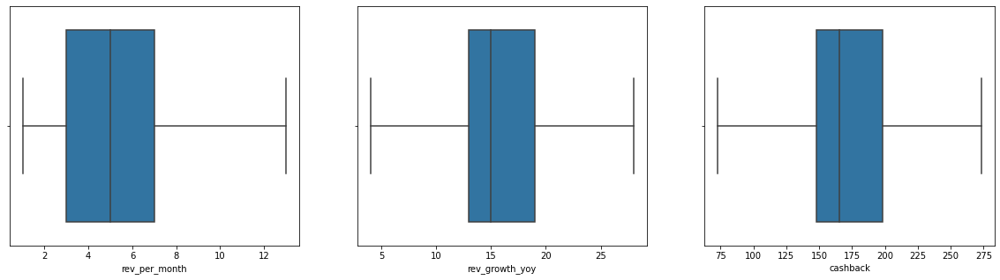

In [67]:
fig, axes = plt.subplots(1, 3, figsize=(20, 5))
sns.boxplot('rev_per_month',data=df1, ax = axes[0])
sns.boxplot('rev_growth_yoy',data=df1, ax = axes[1])
sns.boxplot('cashback',data=df1, ax = axes[2]) 

#### Variable Transformation for Categorical Variables - One Hot Encodig

In [68]:
df1.head()

,Churn,Tenure,City_Tier,CC_Contacted_LY,Payment,Gender,Service_Score,Account_user_count,account_segment,CC_Agent_Score,Marital_Status,rev_per_month,Complain_ly,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,cashback,Login_device
0,1,4.0,3.0,6.0,Debit Card,F,3.0,3.0,Super,2.0,Single,9.0,1.0,11.0,1.0,5.0,159.93,Mobile
1,1,0.0,1.0,8.0,UPI,M,3.0,4.0,Regular Plus,3.0,Single,7.0,1.0,15.0,0.0,0.0,120.90,Mobile
2,1,0.0,1.0,30.0,Debit Card,M,2.0,4.0,Regular Plus,3.0,Single,6.0,1.0,14.0,0.0,3.0,165.62,Mobile
3,1,0.0,3.0,15.0,Debit Card,M,2.0,4.0,Super,5.0,Single,8.0,0.0,23.0,0.0,3.0,134.07,Mobile
4,1,0.0,1.0,12.0,Credit Card,M,2.0,3.0,Regular Plus,5.0,Single,3.0,0.0,11.0,1.0,3.0,129.60,Mobile


#### Types of encoding techniques - Label, one hot, here we will use one hot encoding from pandas / get_dummies. The reason we are not using label encoder is sometimes the problem might occur when there are different number in the same column , model misunderstands the data to be in some kind of order like 0>1>2 which results in a correlation that the model derives but is not the actual case. To overcome this problem we use dummies which creates multiple columns and avoids mis-interpretation 

In [69]:
df1 = pd.get_dummies(df1, drop_first=True)
df1.head().T

,0,1,2,3,4
Churn,1.00,1.0,1.00,1.00,1.0
Tenure,4.00,0.0,0.00,0.00,0.0
City_Tier,3.00,1.0,1.00,3.00,1.0
CC_Contacted_LY,6.00,8.0,30.00,15.00,12.0
Service_Score,3.00,3.0,2.00,2.00,2.0
Account_user_count,3.00,4.0,4.00,4.00,3.0
CC_Agent_Score,2.00,3.0,3.00,5.00,5.0
rev_per_month,9.00,7.0,6.00,8.00,3.0
Complain_ly,1.00,1.0,1.00,0.00,0.0
rev_growth_yoy,11.00,15.0,14.00,23.00,11.0


### Dummy variable trap : it is a scenario where there are attributes which leads to multicollinearity, and one variable predicts the value of others. When we use one hot encoding for handling the categorical data one dummy tried to predict the other one which results in multicollinearity. For example Gender . In order to avoid that we drop the first one.

In [70]:
#pip install --upgrade scikit-learn

In [71]:
import pandas_profiling
df1.profile_report()

#### Seperating Independent and Dependent variables

In [72]:
from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn import metrics
from sklearn.metrics import classification_report,roc_auc_score,roc_curve,confusion_matrix,plot_confusion_matrix

In [73]:
#Taking the dependent variable in y and having the rest independent variables 
y = df1.Churn
x = df1.drop(['Churn'],axis=1)

#### Amount of multicollinearity present in data

In [74]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

def calc_vif(x):

    # Calculating VIF
    vif = pd.DataFrame()
    vif["variables"] = x.columns
    vif["VIF"] = [variance_inflation_factor(x.values, i) for i in range(x.shape[1])]

    return(vif)

In [75]:
df_vif = calc_vif(x).sort_values(by='VIF', ascending = True)
df_vif

,variables,VIF
7,Complain_ly,1.388006
17,account_segment_Regular,1.654832
15,Payment_UPI,1.776944
20,account_segment_Super Plus,1.879467
0,Tenure,1.975280
9,coupon_used_for_payment,2.242196
16,Gender_M,2.553390
14,Payment_E wallet,2.579257
22,Marital_Status_Single,2.979399
10,Day_Since_CC_connect,3.357868


In [76]:
df1.corr()

,Churn,Tenure,City_Tier,CC_Contacted_LY,Service_Score,Account_user_count,CC_Agent_Score,rev_per_month,Complain_ly,rev_growth_yoy,...,Payment_E wallet,Payment_UPI,Gender_M,account_segment_Regular,account_segment_Regular Plus,account_segment_Super,account_segment_Super Plus,Marital_Status_Married,Marital_Status_Single,Login_device_Mobile
Churn,1.000000,-0.229326,0.085084,0.070518,0.007386,0.106020,0.105591,0.041272,0.244694,-0.014672,...,0.054694,0.002041,0.029372,-0.053135,0.210165,-0.129340,-0.090776,-0.151318,0.182435,-0.046610
Tenure,-0.229326,1.000000,-0.027126,-0.004720,0.007706,-0.005706,-0.017452,0.129664,-0.019268,0.020129,...,0.008002,-0.032114,-0.028264,0.165784,-0.227688,-0.013037,0.224386,0.044795,-0.065035,0.014208
City_Tier,0.085084,-0.027126,1.000000,0.011614,-0.006837,0.024850,-0.011617,-0.020683,0.001440,-0.029018,...,0.508903,-0.032696,-0.023071,-0.040227,-0.249010,0.222132,0.001821,-0.033498,0.024410,0.000735
CC_Contacted_LY,0.070518,-0.004720,0.011614,1.000000,0.060289,0.022418,0.002858,0.064195,0.027404,0.072798,...,0.034374,-0.007081,-0.004388,-0.072176,-0.047569,0.043561,0.028809,0.024774,-0.020281,-0.019414
Service_Score,0.007386,0.007706,-0.006837,0.060289,1.000000,0.314283,0.035609,0.125082,0.003054,0.105084,...,0.003389,-0.026640,-0.016715,-0.014799,0.025990,-0.010692,-0.031456,0.034542,-0.049738,0.015068
Account_user_count,0.106020,-0.005706,0.024850,0.022418,0.314283,1.000000,-0.016754,0.067836,0.000982,0.066454,...,0.025394,0.011377,-0.020053,0.025274,-0.005948,-0.011702,-0.035535,-0.030842,0.038709,-0.014419
CC_Agent_Score,0.105591,-0.017452,-0.011617,0.002858,0.035609,-0.016754,1.000000,0.050213,-0.031597,-0.025911,...,0.018292,0.008867,-0.034601,0.003733,0.008585,-0.019560,0.001582,-0.021857,-0.022683,0.033122
rev_per_month,0.041272,0.129664,-0.020683,0.064195,0.125082,0.067836,0.050213,1.000000,-0.022576,0.051608,...,-0.012909,0.005625,-0.025753,0.037130,-0.111435,0.034403,0.066261,0.006951,-0.006625,0.020797
Complain_ly,0.244694,-0.019268,0.001440,0.027404,0.003054,0.000982,-0.031597,-0.022576,1.000000,-0.001891,...,0.009086,0.019009,-0.034656,-0.015719,0.012193,-0.018436,0.016411,-0.002607,-0.000205,0.006917
rev_growth_yoy,-0.014672,0.020129,-0.029018,0.072798,0.105084,0.066454,-0.025911,0.051608,-0.001891,1.000000,...,-0.030246,0.005746,0.000324,-0.047655,0.021393,-0.009377,0.009377,0.011712,0.003750,-0.013667


In [77]:
#Let's drop cashback column and check vif again --- cashback is negatively correlated with our target variable also has a high value of multicollienarity 
x = x.drop(['cashback'],axis=1)
df_vif = calc_vif(x).sort_values(by='VIF', ascending = True)
df_vif

,variables,VIF
16,account_segment_Regular,1.338849
7,Complain_ly,1.382096
19,account_segment_Super Plus,1.517469
14,Payment_UPI,1.736581
0,Tenure,1.958665
9,coupon_used_for_payment,2.241654
15,Gender_M,2.499628
13,Payment_E wallet,2.548922
21,Marital_Status_Single,2.906902
10,Day_Since_CC_connect,3.273198


In [78]:
x = x.drop(['rev_growth_yoy'],axis=1)
df_vif = calc_vif(x).sort_values(by='VIF', ascending = True)
df_vif

,variables,VIF
15,account_segment_Regular,1.338662
7,Complain_ly,1.380676
18,account_segment_Super Plus,1.510274
13,Payment_UPI,1.704771
0,Tenure,1.947304
8,coupon_used_for_payment,2.241596
14,Gender_M,2.486065
12,Payment_E wallet,2.531197
20,Marital_Status_Single,2.860707
9,Day_Since_CC_connect,3.250255


In [79]:
x = x.drop(['Service_Score'],axis=1)
df_vif = calc_vif(x).sort_values(by='VIF', ascending = True)
df_vif

,variables,VIF
14,account_segment_Regular,1.338521
6,Complain_ly,1.378715
17,account_segment_Super Plus,1.510112
12,Payment_UPI,1.697429
0,Tenure,1.942620
7,coupon_used_for_payment,2.205106
13,Gender_M,2.480804
11,Payment_E wallet,2.519346
19,Marital_Status_Single,2.856677
8,Day_Since_CC_connect,3.181313


In [80]:
x = x.drop(['Account_user_count'],axis=1)
df_vif = calc_vif(x).sort_values(by='VIF', ascending = True)
df_vif

,variables,VIF
13,account_segment_Regular,1.331105
5,Complain_ly,1.375192
16,account_segment_Super Plus,1.509634
11,Payment_UPI,1.662120
0,Tenure,1.935615
6,coupon_used_for_payment,2.141721
12,Gender_M,2.468096
10,Payment_E wallet,2.489929
18,Marital_Status_Single,2.774893
7,Day_Since_CC_connect,3.142536


In [81]:
x = x.drop(['City_Tier'],axis=1)
df_vif = calc_vif(x).sort_values(by='VIF', ascending = True)
df_vif

,variables,VIF
12,account_segment_Regular,1.331093
4,Complain_ly,1.373470
15,account_segment_Super Plus,1.506071
10,Payment_UPI,1.641456
0,Tenure,1.935599
9,Payment_E wallet,1.943655
5,coupon_used_for_payment,2.133157
11,Gender_M,2.457499
17,Marital_Status_Single,2.718461
14,account_segment_Super,3.081675


#### Train and Test Split

In [82]:
#Splitting into train and test
x_train_unbl, x_test, y_train_unbl, y_test = train_test_split(x, y, test_size=0.3, random_state=1)

In [83]:
print('X_train',x_train_unbl.shape)
print('X_test',x_test.shape)
print('train_labels before',y_train_unbl.shape)
print('test_labels',y_test.shape)
print('Total Obs',7697+3299)

X_train (7697, 19)
X_test (3299, 19)
train_labels before (7697,)
test_labels (3299,)
Total Obs 10996


#### Balancing the Dataset

In [84]:
from numpy import where
import matplotlib.pyplot as plt

from collections import Counter
from sklearn.datasets import make_classification
from imblearn.over_sampling import SMOTE

In [85]:
#pip install imblearn

In [86]:
sm = SMOTE(random_state=2)
x_train, y_train = sm.fit_resample(x_train_unbl, y_train_unbl.ravel())

In [87]:
x_train.shape

(12800, 19)

#### Importing all the models to be used 

In [88]:
#Importing the Machine LEarning Algorithms to predict Churn
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neural_network import MLPClassifier

#### Naive Bayes Classifier

#### Based on Bayes Therorem, i.e, prob of an event occuring given that the probability of another even that has already occured wrt our dataset, customer will churn given the other conditions. Naive bayes makes naive assumptions such as every feature is independent of each other and makes an independent outcome, also it says that every feature will contribute equally to the outcome.
#### Types of NB: Gaussian, Multinomial and Bernoulli , the last two are used generally for document or text analysis also used for spam filtering.
#### Gaussian NB assumes that the distribution of the data set is Gauusian curve.

In [89]:
NB_SM_model = GaussianNB()
NB_SM_model.fit(x_train, y_train)

GaussianNB()

In [90]:
y_train_predict = NB_SM_model.predict(x_train)
y_test_predict = NB_SM_model.predict(x_test)

In [91]:
NB_Train_Acc = metrics.accuracy_score(y_train, y_train_predict)
NB_Train_Acc

0.714921875

In [92]:
NB_Test_Acc = metrics.accuracy_score(y_test, y_test_predict)
NB_Test_Acc

0.6095786602000606

#### 00 - TN, 01 - FN, 10 - FP, 11 - TP
#### False positive is type 1 error because it has one false - 1,0; False Negative - Type II error with 2 negations

Text(0.5, 1.0, 'Confusion Matrix (Training Data)')

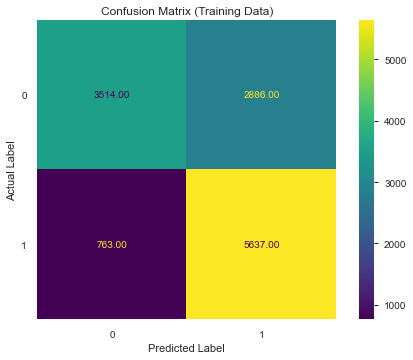

In [93]:
plot_confusion_matrix(NB_SM_model,x_train,y_train,values_format='.2f');
plt.xlabel('Predicted Label')
plt.ylabel('Actual Label')
plt.title('Confusion Matrix (Training Data)')

Text(0.5, 1.0, 'Confusion Matrix (Training Data)')

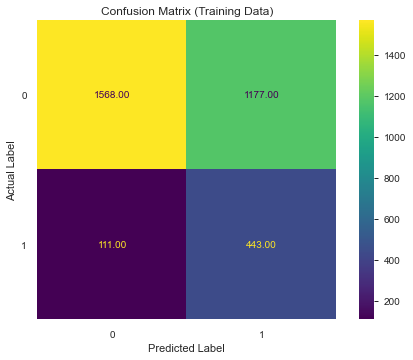

In [94]:
plot_confusion_matrix(NB_SM_model,x_test,y_test,values_format='.2f');
plt.xlabel('Predicted Label')
plt.ylabel('Actual Label')
plt.title('Confusion Matrix (Training Data)')

#### 

AUC: 0.834


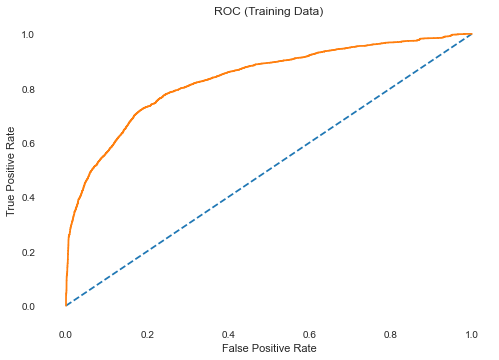

In [95]:
# predict probabilities
probs = NB_SM_model.predict_proba(x_train)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
NB_Train_Auc = roc_auc_score(y_train, probs)
print('AUC: %.3f' % NB_Train_Auc)
# calculate roc curve
NB_train_fpr, NB_train_tpr, NB_train_thresholds = roc_curve(y_train, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC (Training Data)')
plt.plot(NB_train_fpr, NB_train_tpr);

AUC: 0.756


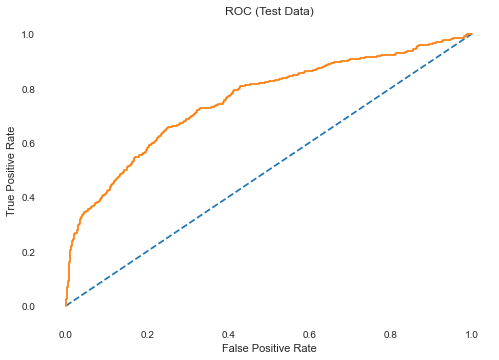

In [96]:
# predict probabilities
probs = NB_SM_model.predict_proba(x_test)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
NB_Test_Auc = roc_auc_score(y_test, probs)
print('AUC: %.3f' % NB_Test_Auc)
# calculate roc curve
NB_test_fpr, NB_test_tpr, NB_test_thresholds = roc_curve(y_test, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC (Test Data)')
plt.plot(NB_test_fpr, NB_test_tpr);

#### Precision = TP/ (TP + FP); Recall = TP/(TP+FN);  Accuracy = (TP+TN)/(TP+TN+FP+FN); Specificity = TN/(TN+TP); F1 Score - 2*P*R/(P+R)

In [97]:
print("Classification Report")
print(metrics.classification_report(y_train, y_train_predict, labels=[1.0, 0.0]))

Classification Report
              precision    recall  f1-score   support

         1.0       0.66      0.88      0.76      6400
         0.0       0.82      0.55      0.66      6400

    accuracy                           0.71     12800
   macro avg       0.74      0.71      0.71     12800
weighted avg       0.74      0.71      0.71     12800



In [98]:
print("Classification Report")
print(metrics.classification_report(y_test, y_test_predict, labels=[1.0, 0.0]))

Classification Report
              precision    recall  f1-score   support

         1.0       0.27      0.80      0.41       554
         0.0       0.93      0.57      0.71      2745

    accuracy                           0.61      3299
   macro avg       0.60      0.69      0.56      3299
weighted avg       0.82      0.61      0.66      3299



In [99]:
NB = classification_report(y_train,y_train_predict,output_dict=True)
df = pd.DataFrame(NB).transpose()
df
NB_Train_precision = round(df.loc["1"][0],2)
NB_Train_recall = round(df.loc["1"][1],2)
NB_Train_f1 = round(df.loc["1"][2],2)
print ('NB_Train_precision ',NB_Train_precision)
print ('NB_Train_recall ',NB_Train_recall)
print ('NB_Train_f1 ',NB_Train_f1)

NB_Train_precision  0.66
NB_Train_recall  0.88
NB_Train_f1  0.76


In [100]:
NB = classification_report(y_test,y_test_predict,output_dict=True)
df = pd.DataFrame(NB).transpose()
df
NB_Test_precision = round(df.loc["1"][0],2)
NB_Test_recall = round(df.loc["1"][1],2)
NB_Test_f1 = round(df.loc["1"][2],2)
print ('NB_Test_precision ',NB_Test_precision)
print ('NB_Test_recall ',NB_Test_recall)
print ('NB_Test_f1 ',NB_Test_f1)

NB_Test_precision  0.27
NB_Test_recall  0.8
NB_Test_f1  0.41


#### KNN

In [101]:
KNN_model=KNeighborsClassifier()
KNN_model.fit(x_train,y_train)

KNeighborsClassifier()

In [102]:
ytrain_predict = KNN_model.predict(x_train)
ytest_predict = KNN_model.predict(x_test)

In [103]:
ytest_predict_prob=KNN_model.predict_proba(x_test)

In [104]:
ytrain_predict_prob=KNN_model.predict_proba(x_train)

In [105]:
# Accuracy - Training Data
KNN_Train_Acc = KNN_model.score(x_train, y_train)
KNN_Train_Acc

0.947265625

In [106]:
# Accuracy - Test Data
KNN_Test_Acc = KNN_model.score(x_test, y_test)
KNN_Test_Acc

0.8426795998787512

AUC: 0.998


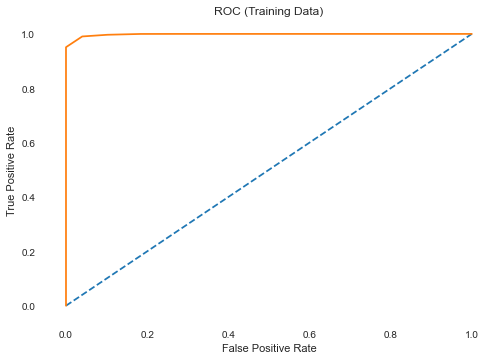

In [107]:
# predict probabilities
probs = KNN_model.predict_proba(x_train)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
KNN_Train_Auc = roc_auc_score(y_train, probs)
print('AUC: %.3f' % KNN_Train_Auc)
# calculate roc curve
KNN_train_fpr, KNN_train_tpr, KNN_train_thresholds = roc_curve(y_train, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC (Training Data)')
plt.plot(KNN_train_fpr, KNN_train_tpr);

AUC: 0.998


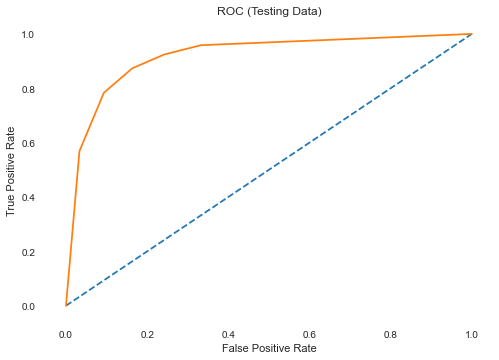

In [108]:
# predict probabilities
probs = KNN_model.predict_proba(x_test)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
KNN_Test_Auc = roc_auc_score(y_test, probs)
print('AUC: %.3f' % KNN_Train_Auc)
# calculate roc curve
KNN_test_fpr, KNN_test_tpr, KNN_test_thresholds = roc_curve(y_test, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC (Testing Data)')
plt.plot(KNN_test_fpr, KNN_test_tpr);

In [109]:
confusion_matrix(y_train, ytrain_predict)

array([[5745,  655],
       [  20, 6380]], dtype=int64)

Text(0.5, 1.0, 'Confusion Matrix (Training Data)')

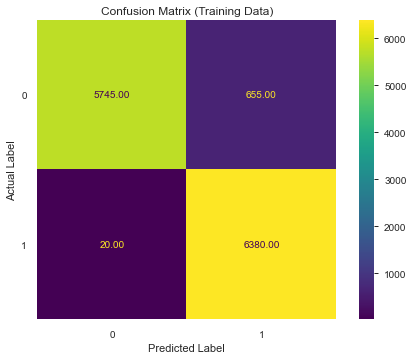

In [110]:
plot_confusion_matrix(KNN_model,x_train,y_train,values_format='.2f');
plt.xlabel('Predicted Label')
plt.ylabel('Actual Label')
plt.title('Confusion Matrix (Training Data)')

In [111]:
print(classification_report(y_train, ytrain_predict))

              precision    recall  f1-score   support

           0       1.00      0.90      0.94      6400
           1       0.91      1.00      0.95      6400

    accuracy                           0.95     12800
   macro avg       0.95      0.95      0.95     12800
weighted avg       0.95      0.95      0.95     12800



In [112]:
KNN = classification_report(y_train,ytrain_predict,output_dict=True)
df = pd.DataFrame(KNN).transpose()
df
KNN_Train_precision = round(df.loc["1"][0],2)
KNN_Train_recall = round(df.loc["1"][1],2)
KNN_Train_f1 = round(df.loc["1"][2],2)
print ('KNN_Train_precision',KNN_Train_precision)
print ('KNN_Train_recall',KNN_Train_recall)
print ('KNN_Train_f1',KNN_Train_f1)

KNN_Train_precision 0.91
KNN_Train_recall 1.0
KNN_Train_f1 0.95


In [113]:
confusion_matrix(y_test, ytest_predict)

array([[2296,  449],
       [  70,  484]], dtype=int64)

Text(0.5, 1.0, 'Confusion Matrix (Test Data)')

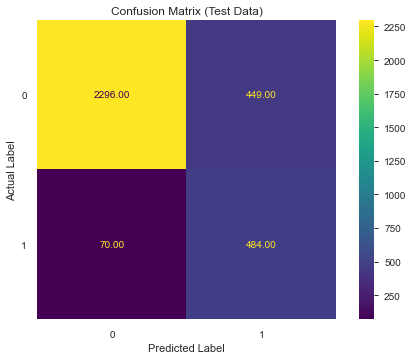

In [114]:
plot_confusion_matrix(KNN_model,x_test,y_test,values_format='.2f');
plt.xlabel('Predicted Label')
plt.ylabel('Actual Label')
plt.title('Confusion Matrix (Test Data)')

In [115]:
print(classification_report(y_test, ytest_predict))

              precision    recall  f1-score   support

           0       0.97      0.84      0.90      2745
           1       0.52      0.87      0.65       554

    accuracy                           0.84      3299
   macro avg       0.74      0.86      0.77      3299
weighted avg       0.89      0.84      0.86      3299



In [116]:
KNN = classification_report(y_test,ytest_predict,output_dict=True)
df = pd.DataFrame(KNN).transpose()
df
KNN_Test_precision = round(df.loc["1"][0],2)
KNN_Test_recall = round(df.loc["1"][1],2)
KNN_Test_f1 = round(df.loc["1"][2],2)
print ('KNN_Test_precision',KNN_Test_precision)
print ('KNN_Test_recall',KNN_Test_recall)
print ('KNN_Test_f1',KNN_Test_f1)

KNN_Test_precision 0.52
KNN_Test_recall 0.87
KNN_Test_f1 0.65


#### Building Decision Tree Classifier 

In [117]:
dt_model = DecisionTreeClassifier(criterion = 'gini')
dt_model.fit(x_train, y_train)

DecisionTreeClassifier()

In [118]:
from sklearn import tree

train_char_label = ['No', 'Yes']
ld_Tree_File = open('C:/Users/Admin/Desktop/Python for Data Science GL/CC_EDTH_02_Customer Churn/ld_Tree_File.dot','w')
dot_data = tree.export_graphviz(dt_model, 
                                out_file=ld_Tree_File, 
                                feature_names = list(x_train), 
                                class_names = list(train_char_label))

ld_Tree_File.close()


In [119]:
print (pd.DataFrame(dt_model.feature_importances_, columns = ["Imp"], index = x_train.columns).sort_values('Imp',ascending=False))

                                   Imp
Tenure                        0.418858
Complain_ly                   0.134547
CC_Agent_Score                0.068069
rev_per_month                 0.066057
CC_Contacted_LY               0.064016
Day_Since_CC_connect          0.049234
coupon_used_for_payment       0.035961
Marital_Status_Married        0.027987
Login_device_Mobile           0.026636
Payment_Credit Card           0.019540
account_segment_Regular Plus  0.019489
account_segment_Super         0.017596
Payment_Debit Card            0.016124
Gender_M                      0.013194
Payment_UPI                   0.008171
Marital_Status_Single         0.007450
Payment_E wallet              0.004209
account_segment_Super Plus    0.002177
account_segment_Regular       0.000684


In [120]:
dt_model.feature_importances_

array([0.41885763, 0.06401614, 0.06806866, 0.06605683, 0.13454669,
       0.03596097, 0.04923368, 0.01954007, 0.01612445, 0.00420872,
       0.00817146, 0.01319394, 0.00068443, 0.01948944, 0.01759649,
       0.00217736, 0.02798698, 0.0074499 , 0.02663615])

In [121]:
#predicting test data
ytrain_predict = dt_model.predict(x_train)
ytest_predict = dt_model.predict(x_test)

In [122]:
ytest_predict

array([0, 0, 0, ..., 0, 1, 0], dtype=int64)

In [123]:
ytest_predict.shape

(3299,)

In [124]:
#Regularising the Decision Tree
#Adding Tuning parameters 
param_grid = {
    "criterion":['gini'],
    'max_depth': [10, 12, 15, 20],
    'min_samples_leaf': [20,30,50,100],
    'min_samples_split':[150,200,250,300]
}
dt_model = DecisionTreeClassifier(random_state=1)

grid_search = GridSearchCV(estimator = dt_model, param_grid=param_grid,cv = 5)

In [125]:
grid_search.fit(x_train, y_train)

GridSearchCV(cv=5, estimator=DecisionTreeClassifier(random_state=1),
             param_grid={'criterion': ['gini'], 'max_depth': [10, 12, 15, 20],
                         'min_samples_leaf': [20, 30, 50, 100],
                         'min_samples_split': [150, 200, 250, 300]})

In [126]:
print(grid_search.best_params_)

{'criterion': 'gini', 'max_depth': 10, 'min_samples_leaf': 20, 'min_samples_split': 200}


In [127]:
best_grid = grid_search.best_estimator_
best_grid

DecisionTreeClassifier(max_depth=10, min_samples_leaf=20, min_samples_split=200,
                       random_state=1)

In [128]:
#scoring decision tree
print(best_grid.score(x_train, y_train))
print(best_grid.score(x_test, y_test))

0.890625
0.868748105486511


In [129]:
#variable importance
print (pd.DataFrame(best_grid.feature_importances_, columns = ["Imp"], index = x_train.columns).sort_values('Imp',ascending=False))

                                   Imp
Tenure                        0.561426
Complain_ly                   0.195105
CC_Agent_Score                0.040404
Marital_Status_Married        0.038173
rev_per_month                 0.037289
coupon_used_for_payment       0.023312
Payment_Credit Card           0.020777
Login_device_Mobile           0.018917
account_segment_Regular Plus  0.017689
Day_Since_CC_connect          0.016413
account_segment_Super         0.010328
Payment_Debit Card            0.006302
Gender_M                      0.005766
CC_Contacted_LY               0.005730
Payment_UPI                   0.001478
Marital_Status_Single         0.000881
account_segment_Regular       0.000011
account_segment_Super Plus    0.000000
Payment_E wallet              0.000000


In [130]:
#Visualizing the Decision Tree
from sklearn import tree

train_char_label = ['No', 'Yes']
ld_Tree_reg = open('C:/Users/Admin/Desktop/Python for Data Science GL/CC_EDTH_02_Customer Churn/ld_Tree_reg.dot','w')
dot_data = tree.export_graphviz(best_grid, 
                                out_file= ld_Tree_reg , 
                                feature_names = list(x_train), 
                                class_names = list(train_char_label))

ld_Tree_reg.close()
dot_data

http://webgraphviz.com/

In [131]:
ytrain_predict = best_grid.predict(x_train)
ytest_predict = best_grid.predict(x_test)

In [132]:
ytest_predict_prob=best_grid.predict_proba(x_test)
pd.DataFrame(ytest_predict_prob).head()

,0,1
0,0.825503,0.174497
1,1.000000,0.000000
2,1.000000,0.000000
3,0.140704,0.859296
4,1.000000,0.000000


In [133]:
ytrain_predict_prob=best_grid.predict_proba(x_train)
pd.DataFrame(ytrain_predict_prob).head()

,0,1
0,0.957377,0.042623
1,0.927083,0.072917
2,0.574194,0.425806
3,0.426230,0.573770
4,0.899811,0.100189


In [134]:
# Accuracy - Training Data
CART_Train_Acc = best_grid.score(x_train, y_train)
CART_Train_Acc

0.890625

In [135]:
# Accuracy - Test Data
CART_Test_Acc=best_grid.score(x_test, y_test)
CART_Test_Acc

0.868748105486511

AUC: 0.960


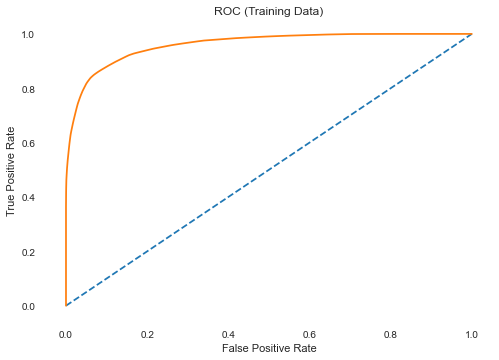

In [136]:
# predict probabilities
probs = best_grid.predict_proba(x_train)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
CART_Train_Auc = roc_auc_score(y_train, probs)
print('AUC: %.3f' % CART_Train_Auc)
# calculate roc curve
CART_train_fpr, CART_train_tpr, CART_train_thresholds = roc_curve(y_train, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC (Training Data)')
plt.plot(CART_train_fpr, CART_train_tpr);

AUC: 0.880


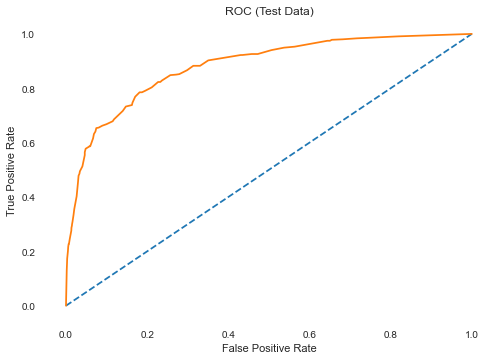

In [137]:
# predict probabilities
probs = best_grid.predict_proba(x_test)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
CART_Test_Auc = roc_auc_score(y_test, probs)
print('AUC: %.3f' % CART_Test_Auc)
# calculate roc curve
CART_test_fpr, CART_test_tpr, CART_test_thresholds = roc_curve(y_test, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC (Test Data)')
plt.plot(CART_test_fpr, CART_test_tpr);

In [138]:
confusion_matrix(y_train, ytrain_predict)

array([[5889,  511],
       [ 889, 5511]], dtype=int64)

Text(0.5, 1.0, 'Confusion Matrix (Training Data)')

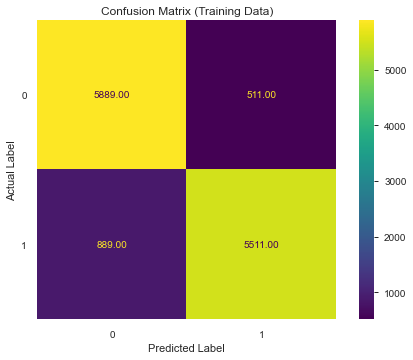

In [139]:
plot_confusion_matrix(best_grid,x_train,y_train,values_format='.2f');
plt.xlabel('Predicted Label')
plt.ylabel('Actual Label')
plt.title('Confusion Matrix (Training Data)')

In [140]:
print(classification_report(y_train, ytrain_predict))

              precision    recall  f1-score   support

           0       0.87      0.92      0.89      6400
           1       0.92      0.86      0.89      6400

    accuracy                           0.89     12800
   macro avg       0.89      0.89      0.89     12800
weighted avg       0.89      0.89      0.89     12800



In [141]:
CART = classification_report(y_train,ytrain_predict,output_dict=True)
df = pd.DataFrame(CART).transpose()
df
CART_Train_precision = round(df.loc["1"][0],2)
CART_Train_recall = round(df.loc["1"][1],2)
CART_Train_f1 = round(df.loc["1"][2],2)
print ('CART_Train_precision ',CART_Train_precision)
print ('CART_Train_recall ',CART_Train_recall)
print ('CART_Train_f1 ',CART_Train_f1)

CART_Train_precision  0.92
CART_Train_recall  0.86
CART_Train_f1  0.89


In [142]:
confusion_matrix(y_test, ytest_predict)

array([[2499,  246],
       [ 187,  367]], dtype=int64)

Text(0.5, 1.0, 'Confusion Matrix (Test Data)')

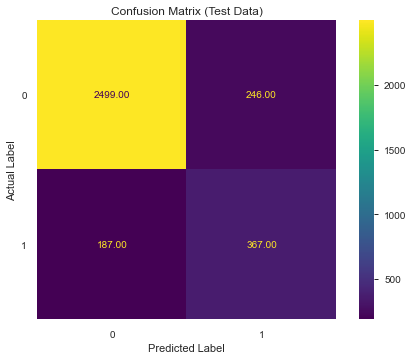

In [143]:
plot_confusion_matrix(best_grid,x_test,y_test,values_format='.2f');
plt.xlabel('Predicted Label')
plt.ylabel('Actual Label')
plt.title('Confusion Matrix (Test Data)')

In [144]:
print(classification_report(y_test, ytest_predict))

              precision    recall  f1-score   support

           0       0.93      0.91      0.92      2745
           1       0.60      0.66      0.63       554

    accuracy                           0.87      3299
   macro avg       0.76      0.79      0.77      3299
weighted avg       0.87      0.87      0.87      3299



In [145]:
CART = classification_report(y_test,ytest_predict,output_dict=True)
df = pd.DataFrame(CART).transpose()
df
CART_Test_precision = round(df.loc["1"][0],2)
CART_Test_recall = round(df.loc["1"][1],2)
CART_Test_f1 = round(df.loc["1"][2],2)
print ('CART_Test_precision ',CART_Test_precision)
print ('CART_Test_recall ',CART_Test_recall)
print ('CART_Test_f1 ',CART_Test_f1)

CART_Test_precision  0.6
CART_Test_recall  0.66
CART_Test_f1  0.63


## Random Forest Classifier

In [146]:
rfcl = RandomForestClassifier(n_estimators = 501)
rfcl = rfcl.fit(x_train, y_train)

In [147]:
param_grid = {
    'max_depth': [7, 10],
    'max_features': [4, 6],
    'min_samples_leaf': [50, 100],
    'min_samples_split': [150, 300],
    'n_estimators': [301, 501]
}

rfcl = RandomForestClassifier()

grid_search = GridSearchCV(estimator = rfcl, param_grid = param_grid, cv = 5)



In [148]:
grid_search.fit(x_train, y_train)

GridSearchCV(cv=5, estimator=RandomForestClassifier(),
             param_grid={'max_depth': [7, 10], 'max_features': [4, 6],
                         'min_samples_leaf': [50, 100],
                         'min_samples_split': [150, 300],
                         'n_estimators': [301, 501]})

In [149]:
grid_search.best_params_

{'max_depth': 10,
 'max_features': 4,
 'min_samples_leaf': 50,
 'min_samples_split': 150,
 'n_estimators': 301}

In [150]:
best_grid = grid_search.best_estimator_
best_grid

RandomForestClassifier(max_depth=10, max_features=4, min_samples_leaf=50,
                       min_samples_split=150, n_estimators=301)

In [151]:
ytrain_predict = best_grid.predict(x_train)
ytest_predict = best_grid.predict(x_test)

In [152]:
# Accuracy - Training Data
RFCL_Train_Acc = best_grid.score(x_train, y_train)
RFCL_Train_Acc

0.90125

In [153]:
# Accuracy - Test Data
RFCL_Test_Acc = best_grid.score(x_test, y_test)
RFCL_Test_Acc

0.8663231282206729

In [154]:
confusion_matrix(y_train, ytrain_predict)

array([[5815,  585],
       [ 679, 5721]], dtype=int64)

Text(0.5, 1.0, 'Confusion Matrix (Training Data)')

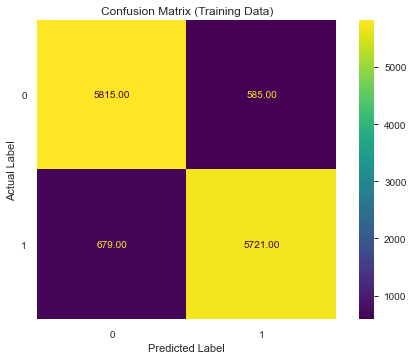

In [155]:
plot_confusion_matrix(best_grid,x_train,y_train,values_format='.2f');
plt.xlabel('Predicted Label')
plt.ylabel('Actual Label')
plt.title('Confusion Matrix (Training Data)')

In [156]:
print(classification_report(y_train, ytrain_predict))

              precision    recall  f1-score   support

           0       0.90      0.91      0.90      6400
           1       0.91      0.89      0.90      6400

    accuracy                           0.90     12800
   macro avg       0.90      0.90      0.90     12800
weighted avg       0.90      0.90      0.90     12800



In [157]:
RFCL = classification_report(y_train,ytrain_predict,output_dict=True)
df = pd.DataFrame(RFCL).transpose()
df
RFCL_Train_precision = round(df.loc["1"][0],2)
RFCL_Train_recall = round(df.loc["1"][1],2)
RFCL_Train_f1 = round(df.loc["1"][2],2)
print ('RFCL_Train_precision ',RFCL_Train_precision)
print ('RFCL_Train_recall ',RFCL_Train_recall)
print ('RFCL_Train_f1 ',RFCL_Train_f1)

RFCL_Train_precision  0.91
RFCL_Train_recall  0.89
RFCL_Train_f1  0.9


In [158]:
confusion_matrix(y_test, ytest_predict)

array([[2446,  299],
       [ 142,  412]], dtype=int64)

Text(0.5, 1.0, 'Confusion Matrix (Test Data)')

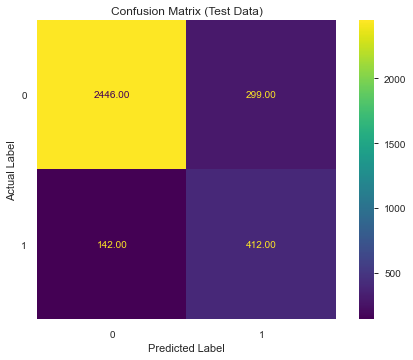

In [159]:
plot_confusion_matrix(best_grid,x_test,y_test,values_format='.2f');
plt.xlabel('Predicted Label')
plt.ylabel('Actual Label')
plt.title('Confusion Matrix (Test Data)')

In [160]:
print(classification_report(y_test, ytest_predict))

              precision    recall  f1-score   support

           0       0.95      0.89      0.92      2745
           1       0.58      0.74      0.65       554

    accuracy                           0.87      3299
   macro avg       0.76      0.82      0.78      3299
weighted avg       0.88      0.87      0.87      3299



AUC: 0.967


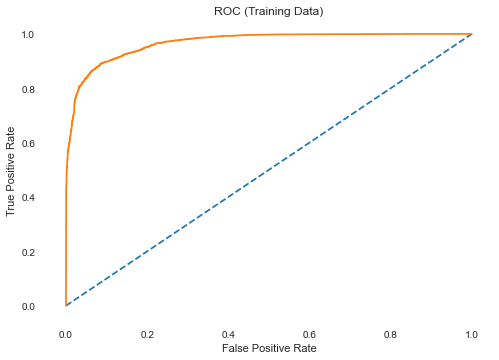

In [161]:
# predict probabilities
probs = best_grid.predict_proba(x_train)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
RFCL_Train_auc = roc_auc_score(y_train, probs)
print('AUC: %.3f' % RFCL_Train_auc)
# calculate roc curve
RFCL_train_fpr, RFCL_train_tpr, RFCL_train_thresholds = roc_curve(y_train, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC (Training Data)')
plt.plot(RFCL_train_fpr, RFCL_train_tpr);

AUC: 0.902


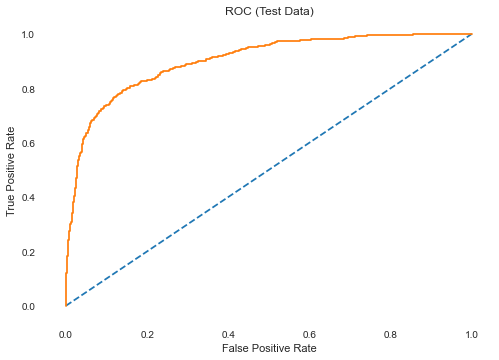

In [162]:
# predict probabilities
probs = best_grid.predict_proba(x_test)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
RFCL_Test_auc = roc_auc_score(y_test, probs)
print('AUC: %.3f' % RFCL_Test_auc)
# calculate roc curve
RFCL_test_fpr, RFCL_test_tpr, RFCL_test_thresholds = roc_curve(y_test, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC (Test Data)')
plt.plot(RFCL_test_fpr, RFCL_test_tpr);

In [163]:
RFCL = classification_report(y_test,ytest_predict,output_dict=True)
df = pd.DataFrame(RFCL).transpose()
df
RFCL_Test_precision = round(df.loc["1"][0],2)
RFCL_Test_recall = round(df.loc["1"][1],2)
RFCL_Test_f1 = round(df.loc["1"][2],2)
print ('RFCL_Train_precision ',RFCL_Test_precision)
print ('RFCL_Train_recall ',RFCL_Test_recall)
print ('RFCL_Train_f1 ',RFCL_Test_f1)

RFCL_Train_precision  0.58
RFCL_Train_recall  0.74
RFCL_Train_f1  0.65


## Ensemble Bagging 

In [164]:
from sklearn.ensemble import BaggingClassifier

bgcl = BaggingClassifier(base_estimator=dt_model, n_estimators=50,random_state=1)
#bgcl = BaggingClassifier(n_estimators=50,random_state=1)

bgcl = bgcl.fit(x_train, y_train)


In [165]:
y_predict = bgcl.predict(x_test)

ytrain_predict = bgcl.predict(x_train)
ytest_predict = bgcl.predict(x_test)

In [166]:
# Accuracy - Training Data
BG_Train_Acc = bgcl.score(x_train, y_train)
BG_Train_Acc

0.999765625

In [167]:
# Accuracy - Test Data
BG_Test_Acc = bgcl.score(x_test, y_test)
BG_Test_Acc

0.9384662018793574

#### Performance Metrics for - Bagging

##### ROC CURVE - AUC SCORE

AUC: 1.000


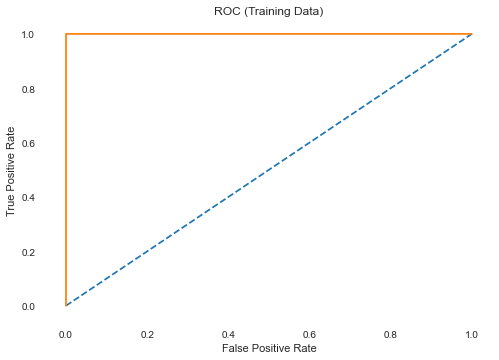

In [168]:
# predict probabilities
probs = bgcl.predict_proba(x_train)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
BG_Train_auc = roc_auc_score(y_train, probs)
print('AUC: %.3f' % BG_Train_auc)
# calculate roc curve
BG_train_fpr, BG_train_tpr, BG_train_thresholds = roc_curve(y_train, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC (Training Data)')
plt.plot(BG_train_fpr, BG_train_tpr);

AUC: 0.969


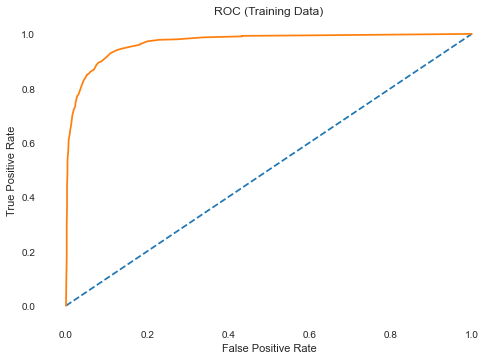

In [169]:
# predict probabilities
probs = bgcl.predict_proba(x_test)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
BG_Test_Auc = roc_auc_score(y_test, probs)
print('AUC: %.3f' % BG_Test_Auc)
# calculate roc curve
BG_test_fpr, BG_test_tpr, BG_test_thresholds = roc_curve(y_test, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC (Training Data)')
plt.plot(BG_test_fpr, BG_test_tpr);

##### CONFUSION MATRIX AND CLASSIFICATION REPORT TRAIN SET - BAGGING

In [170]:
confusion_matrix(y_train, ytrain_predict)

array([[6398,    2],
       [   1, 6399]], dtype=int64)

Text(0.5, 1.0, 'Confusion Matrix (Training Data)')

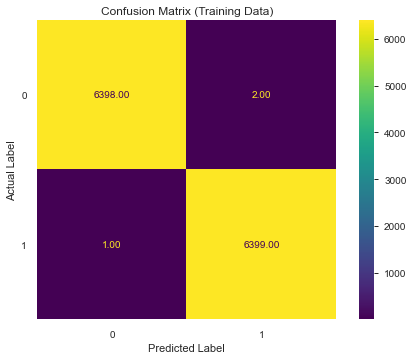

In [171]:
plot_confusion_matrix(bgcl,x_train,y_train,values_format='.2f');
plt.xlabel('Predicted Label')
plt.ylabel('Actual Label')
plt.title('Confusion Matrix (Training Data)')

In [172]:
print(classification_report(y_train, ytrain_predict))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      6400
           1       1.00      1.00      1.00      6400

    accuracy                           1.00     12800
   macro avg       1.00      1.00      1.00     12800
weighted avg       1.00      1.00      1.00     12800



In [173]:
BAGGING = classification_report(y_train,ytrain_predict,output_dict=True)
df = pd.DataFrame(BAGGING).transpose()
df
BG_Train_precision = round(df.loc["1"][0],2)
BG_Train_recall = round(df.loc["1"][1],2)
BG_Train_f1 = round(df.loc["1"][2],2)
print ('BG_Train_precision ',BG_Train_precision)
print ('BG_Train_recall ',BG_Train_recall)
print ('BG_Train_f1 ',BG_Train_f1)

BG_Train_precision  1.0
BG_Train_recall  1.0
BG_Train_f1  1.0


##### CONFUSION MATRIX AND CLASSIFICATION REPORT TEST SET - BAGGING

In [174]:
confusion_matrix(y_test, ytest_predict)

array([[2669,   76],
       [ 127,  427]], dtype=int64)

Text(0.5, 1.0, 'Confusion Matrix (Training Data)')

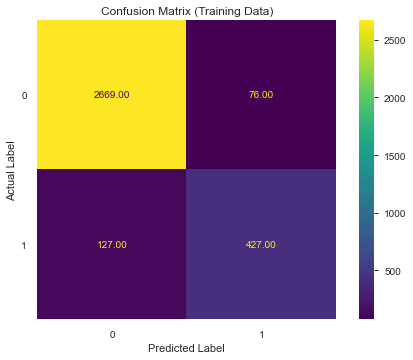

In [175]:
plot_confusion_matrix(bgcl,x_test,y_test,values_format='.2f');
plt.xlabel('Predicted Label')
plt.ylabel('Actual Label')
plt.title('Confusion Matrix (Training Data)')

In [176]:
print(classification_report(y_test, ytest_predict))

              precision    recall  f1-score   support

           0       0.95      0.97      0.96      2745
           1       0.85      0.77      0.81       554

    accuracy                           0.94      3299
   macro avg       0.90      0.87      0.89      3299
weighted avg       0.94      0.94      0.94      3299



In [177]:
BAGGING = classification_report(y_test,ytest_predict,output_dict=True)
df = pd.DataFrame(BAGGING).transpose()
df
BG_Test_precision = round(df.loc["1"][0],2)
BG_Test_recall = round(df.loc["1"][1],2)
BG_Test_f1 = round(df.loc["1"][2],2)
print ('BG_Test_precision ',BG_Test_precision)
print ('BG_Test_recall ',BG_Test_recall)
print ('BG_Test_f1 ',BG_Test_f1)

BG_Test_precision  0.85
BG_Test_recall  0.77
BG_Test_f1  0.81


## Ensemble Boosting

In [178]:
from sklearn.ensemble import AdaBoostClassifier
abcl = AdaBoostClassifier(n_estimators=10, random_state=1)
#abcl = AdaBoostClassifier( n_estimators=50,random_state=1)
abcl = abcl.fit(x_train, y_train)

In [179]:
ytrain_predict = abcl.predict(x_train)
ytest_predict = abcl.predict(x_test)

In [180]:
# Accuracy - Training Data
BS_Train_Acc = abcl.score(x_train, y_train)
BS_Train_Acc

0.857265625

In [181]:
# Accuracy - Test Data
BS_Test_Acc = abcl.score(x_test, y_test)
BS_Test_Acc

0.820854804486208

AUC: 0.929


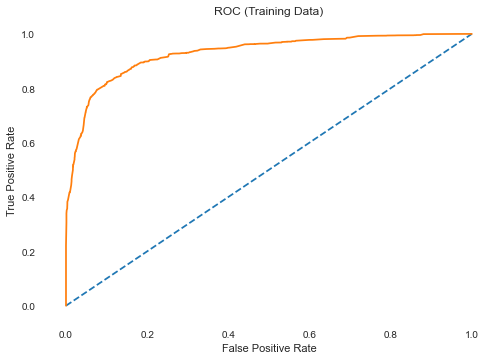

In [182]:
# predict probabilities
probs = abcl.predict_proba(x_train)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
BS_Train_auc = roc_auc_score(y_train, probs)
print('AUC: %.3f' % BS_Train_auc)
# calculate roc curve
BS_train_fpr, BS_train_tpr, BS_train_thresholds = roc_curve(y_train, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC (Training Data)')
plt.plot(BS_train_fpr, BS_train_tpr);

AUC: 0.858


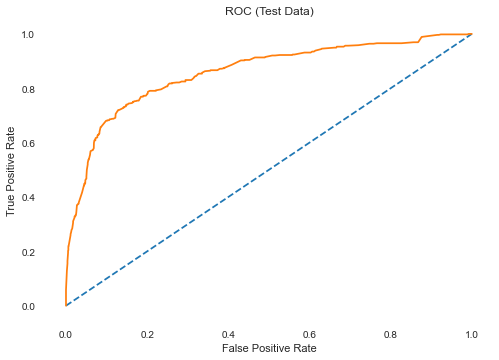

In [183]:
# predict probabilities
probs = abcl.predict_proba(x_test)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
BS_Test_Auc = roc_auc_score(y_test, probs)
print('AUC: %.3f' % BS_Test_Auc)
# calculate roc curve
BS_test_fpr, BS_test_tpr, BS_test_thresholds = roc_curve(y_test, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC (Test Data)')
plt.plot(BS_test_fpr, BS_test_tpr);

In [184]:
confusion_matrix(y_train, ytrain_predict)

array([[5367, 1033],
       [ 794, 5606]], dtype=int64)

Text(0.5, 1.0, 'Confusion Matrix (Training Data)')

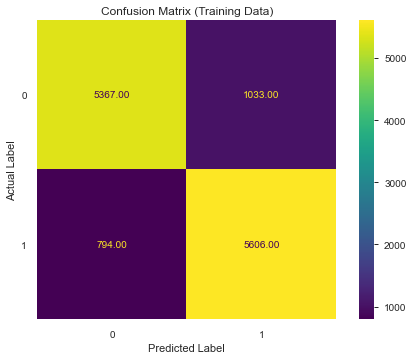

In [185]:
plot_confusion_matrix(abcl,x_train,y_train,values_format='.2f');
plt.xlabel('Predicted Label')
plt.ylabel('Actual Label')
plt.title('Confusion Matrix (Training Data)')

In [186]:
print(classification_report(y_train, ytrain_predict))

              precision    recall  f1-score   support

           0       0.87      0.84      0.85      6400
           1       0.84      0.88      0.86      6400

    accuracy                           0.86     12800
   macro avg       0.86      0.86      0.86     12800
weighted avg       0.86      0.86      0.86     12800



In [187]:
BOOSTING = classification_report(y_train,ytrain_predict,output_dict=True)
df = pd.DataFrame(BOOSTING).transpose()
df
BS_Train_precision = round(df.loc["1"][0],2)
BS_Train_recall = round(df.loc["1"][1],2)
BS_Train_f1 = round(df.loc["1"][2],2)
print ('BS_Train_precision ',BS_Train_precision)
print ('BS_Train_recall ',BS_Train_recall)
print ('BS_Train_f1 ',BS_Train_f1)

BS_Train_precision  0.84
BS_Train_recall  0.88
BS_Train_f1  0.86


In [188]:
confusion_matrix(y_test, ytest_predict)

array([[2293,  452],
       [ 139,  415]], dtype=int64)

Text(0.5, 1.0, 'Confusion Matrix (Test Data)')

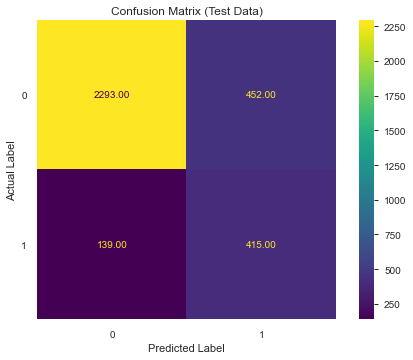

In [189]:
plot_confusion_matrix(abcl,x_test,y_test,values_format='.2f');
plt.xlabel('Predicted Label')
plt.ylabel('Actual Label')
plt.title('Confusion Matrix (Test Data)')

In [190]:
print(classification_report(y_test, ytest_predict))

              precision    recall  f1-score   support

           0       0.94      0.84      0.89      2745
           1       0.48      0.75      0.58       554

    accuracy                           0.82      3299
   macro avg       0.71      0.79      0.73      3299
weighted avg       0.86      0.82      0.84      3299



In [191]:
BOOSTING = classification_report(y_test,ytest_predict,output_dict=True)
df = pd.DataFrame(BOOSTING).transpose()
df
BS_Test_precision = round(df.loc["1"][0],2)
BS_Test_recall = round(df.loc["1"][1],2)
BS_Test_f1 = round(df.loc["1"][2],2)
print ('BS_Test_precision ',BS_Test_precision)
print ('BS_Test_recall ',BS_Test_recall)
print ('BS_Test_f1 ',BS_Test_f1)

BS_Test_precision  0.48
BS_Test_recall  0.75
BS_Test_f1  0.58


## Gradient Boosting

In [192]:
from sklearn.ensemble import GradientBoostingClassifier
gbcl = GradientBoostingClassifier(n_estimators = 50,random_state=1)
gbcl = gbcl.fit(x_train, y_train)

In [193]:
ytrain_predict = gbcl.predict(x_train)
ytest_predict = gbcl.predict(x_test)

In [194]:
# Accuracy - Training Data
GBS_Train_Acc = gbcl.score(x_train, y_train)
GBS_Train_Acc

0.902890625

In [195]:
# Accuracy - Testing Data
GBS_Test_Acc = gbcl.score(x_test, y_test)
GBS_Test_Acc

0.8732949378599576

#### Best Parameters

[0.56960428 0.00482765 0.03247622 0.0397846  0.18464071 0.03219224
 0.03082504 0.01791852 0.00929826 0.         0.0010341  0.
 0.         0.00124875 0.01852265 0.00083395 0.04179435 0.00180027
 0.01319843]


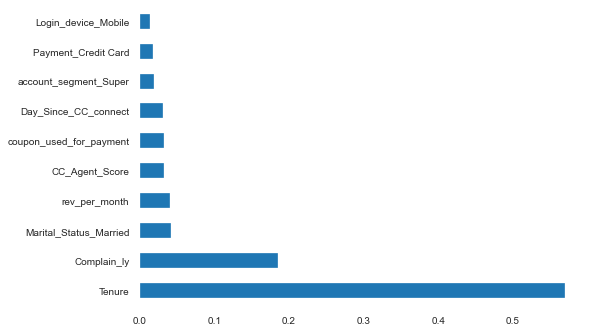

In [196]:
import matplotlib.pyplot as plt
print(gbcl.feature_importances_) #use inbuilt class feature_importances of tree based classifiers
#plot graph of feature importances for better visualization
feat_importances = pd.Series(gbcl.feature_importances_, index=x.columns)
feat_importances.nlargest(10).plot(kind='barh')
plt.show()

In [197]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
bestfeatures = SelectKBest(score_func=chi2, k=10)
fit = bestfeatures.fit(x,y)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(x.columns)
#concat two dataframes for better visualization 
featureScores = pd.concat([dfcolumns,dfscores],axis=1)
featureScores.columns = ['Specs','Score']  #naming the dataframe columns
print(featureScores.nlargest(10,'Score'))  #print 10 best features

                           Specs        Score
0                         Tenure  8657.876175
6           Day_Since_CC_connect   667.264010
4                    Complain_ly   476.367133
13  account_segment_Regular Plus   304.194822
17         Marital_Status_Single   252.514122
1                CC_Contacted_LY   238.581983
14         account_segment_Super   117.720329
16        Marital_Status_Married   116.248275
15    account_segment_Super Plus    83.993841
2                 CC_Agent_Score    75.596386


AUC: 0.968


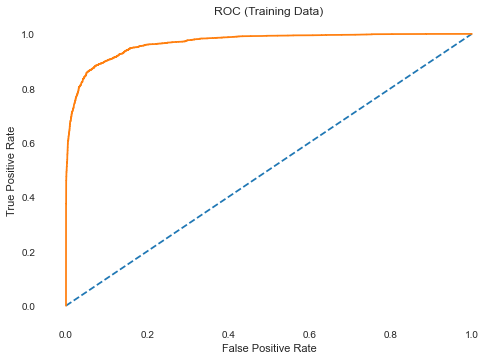

In [198]:
# predict probabilities
probs = gbcl.predict_proba(x_train)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
GBS_Train_auc = roc_auc_score(y_train, probs)
print('AUC: %.3f' % GBS_Train_auc)
# calculate roc curve
GBS_train_fpr, GBS_train_tpr, GBS_train_thresholds = roc_curve(y_train, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC (Training Data)')
plt.plot(GBS_train_fpr, GBS_train_tpr);

AUC: 0.889


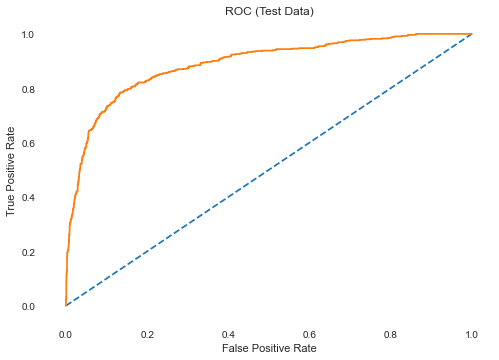

In [199]:
# predict probabilities
probs = gbcl.predict_proba(x_test)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
GBS_Test_Auc = roc_auc_score(y_test, probs)
print('AUC: %.3f' % GBS_Test_Auc)
# calculate roc curve
GBS_test_fpr, GBS_test_tpr, GBS_test_thresholds = roc_curve(y_test, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC (Test Data)')
plt.plot(GBS_test_fpr, GBS_test_tpr);

In [200]:
confusion_matrix(y_train, ytrain_predict)

array([[5860,  540],
       [ 703, 5697]], dtype=int64)

Text(0.5, 1.0, 'Confusion Matrix (Training Data)')

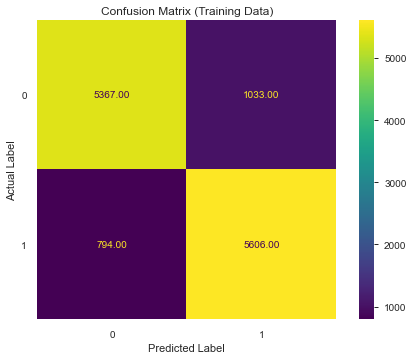

In [201]:
plot_confusion_matrix(abcl,x_train,y_train,values_format='.2f');
plt.xlabel('Predicted Label')
plt.ylabel('Actual Label')
plt.title('Confusion Matrix (Training Data)')

In [202]:
print(classification_report(y_train , ytrain_predict))

              precision    recall  f1-score   support

           0       0.89      0.92      0.90      6400
           1       0.91      0.89      0.90      6400

    accuracy                           0.90     12800
   macro avg       0.90      0.90      0.90     12800
weighted avg       0.90      0.90      0.90     12800



In [203]:
BOOSTING = classification_report(y_train,ytrain_predict,output_dict=True)
df = pd.DataFrame(BOOSTING).transpose()
df
GBS_Train_precision = round(df.loc["1"][0],2)
GBS_Train_recall = round(df.loc["1"][1],2)
GBS_Train_f1 = round(df.loc["1"][2],2)
print ('BS_Train_precision ',GBS_Train_precision)
print ('BS_Train_recall ',GBS_Train_recall)
print ('BS_Train_f1 ',GBS_Train_f1)

BS_Train_precision  0.91
BS_Train_recall  0.89
BS_Train_f1  0.9


In [204]:
confusion_matrix(y_test, ytest_predict)

array([[2486,  259],
       [ 159,  395]], dtype=int64)

Text(0.5, 1.0, 'Confusion Matrix (Test Data)')

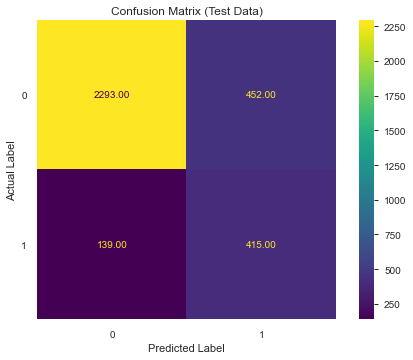

In [205]:
plot_confusion_matrix(abcl,x_test,y_test,values_format='.2f');
plt.xlabel('Predicted Label')
plt.ylabel('Actual Label')
plt.title('Confusion Matrix (Test Data)')

In [206]:
print(classification_report(y_test , ytest_predict))

              precision    recall  f1-score   support

           0       0.94      0.91      0.92      2745
           1       0.60      0.71      0.65       554

    accuracy                           0.87      3299
   macro avg       0.77      0.81      0.79      3299
weighted avg       0.88      0.87      0.88      3299



In [207]:
BOOSTING = classification_report(y_test,ytest_predict,output_dict=True)
df = pd.DataFrame(BOOSTING).transpose()
df
GBS_Test_precision = round(df.loc["1"][0],2)
GBS_Test_recall = round(df.loc["1"][1],2)
GBS_Test_f1 = round(df.loc["1"][2],2)
print ('GBS_Test_precision ',GBS_Test_precision)
print ('GBS_Test_recall ',GBS_Test_recall)
print ('GBS_Test_f1 ',GBS_Test_f1)

GBS_Test_precision  0.6
GBS_Test_recall  0.71
GBS_Test_f1  0.65


## Logistic Regression

In [208]:
# Fit the Logistic Regression model
lg_model = LogisticRegression(solver='newton-cg',max_iter=10000,penalty='none',verbose=True,n_jobs=2)
lg_model.fit(x_train, y_train)

[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done   1 out of   1 | elapsed:   26.5s finished


LogisticRegression(max_iter=10000, n_jobs=2, penalty='none', solver='newton-cg',
                   verbose=True)

In [209]:
ytrain_predict = lg_model.predict(x_train)
ytest_predict = lg_model.predict(x_test)

In [210]:
ytest_predict_prob=lg_model.predict_proba(x_test)
pd.DataFrame(ytest_predict_prob).head()

,0,1
0,0.404951,0.595049
1,0.993799,0.006201
2,0.325636,0.674364
3,0.760785,0.239215
4,0.944666,0.055334


In [211]:
# Accuracy - Train Data
LR_Train_Acc = lg_model.score(x_train, y_train)
LR_Train_Acc

0.81828125

In [212]:
# Accuracy - Test Data
LR_Test_Acc = lg_model.score(x_test, y_test)
LR_Test_Acc

0.8087299181570172

In [213]:
grid={"C":np.logspace(-3,3,7), "penalty":["l1","l2"]}# l1 lasso l2 ridge
logreg=LogisticRegression()
logreg_cv=GridSearchCV(logreg,grid,cv=10)
logreg_cv.fit(x_train,y_train)

print("tuned hpyerparameters :(best parameters) ",logreg_cv.best_params_)
print("accuracy :",logreg_cv.best_score_)

C:\Users\Admin\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:619: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Admin\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Admin\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "C:\Users\Admin\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py", line 444, in _check_solver
    "got %s penalty." % (solver, penalty))
ValueError: Solver lbfgs supports only 'l2' or 'none' penalties, got l1 penalty.

  FitFailedWarning)
C:\Users\Admin\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:619: FitFailedWarning: Estimator fit failed. The score on this trai

C:\Users\Admin\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:619: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Admin\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Admin\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "C:\Users\Admin\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py", line 444, in _check_solver
    "got %s penalty." % (solver, penalty))
ValueError: Solver lbfgs supports only 'l2' or 'none' penalties, got l1 penalty.

  FitFailedWarning)
C:\Users\Admin\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:619: FitFailedWarning: Estimator fit failed. The score on this trai

C:\Users\Admin\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:765: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
C:\Users\Admin\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:765: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-reg

C:\Users\Admin\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:765: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
C:\Users\Admin\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:765: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-reg

C:\Users\Admin\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:765: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
C:\Users\Admin\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:765: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-reg

C:\Users\Admin\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:765: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
C:\Users\Admin\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:765: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-reg

C:\Users\Admin\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:765: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
C:\Users\Admin\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:765: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-reg

C:\Users\Admin\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:765: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
C:\Users\Admin\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:765: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-reg

tuned hpyerparameters :(best parameters)  {'C': 0.01, 'penalty': 'l2'}
accuracy : 0.8211718749999999


C:\Users\Admin\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:765: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


In [214]:
logreg2=LogisticRegression(C=1,penalty="l2")
logreg2.fit(x_train,y_train)
print("score",logreg2.score(x_test,y_test))

score 0.8099424067899363


C:\Users\Admin\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:765: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


In [215]:
ytrain_predict = logreg_cv.predict(x_train)
ytest_predict = logreg2.predict(x_test)

In [216]:
ytest_predict_prob=logreg2.predict_proba(x_test)

In [217]:
# Accuracy - Train Data
LR_Train_Acc = logreg_cv.score(x_train, y_train)
LR_Train_Acc

0.823671875

In [218]:
# Accuracy - Test Data
LR_Test_Acc = logreg2.score(x_test, y_test)
LR_Test_Acc

0.8099424067899363

AUC: 0.894


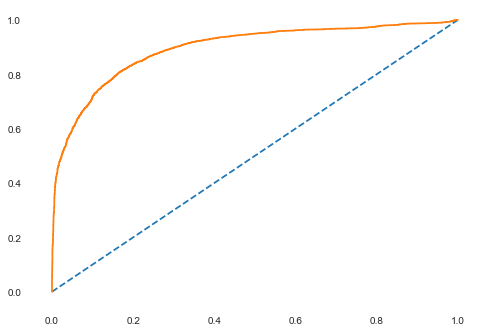

In [219]:
# predict probabilities
probs = logreg2.predict_proba(x_train)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
LR_Train_Auc = roc_auc_score(y_train, probs)
print('AUC: %.3f' % LR_Train_Auc)
# calculate roc curve
LR_train_fpr, LR_train_tpr, LR_train_thresholds = roc_curve(y_train, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(LR_train_fpr, LR_train_tpr);

AUC: 0.818


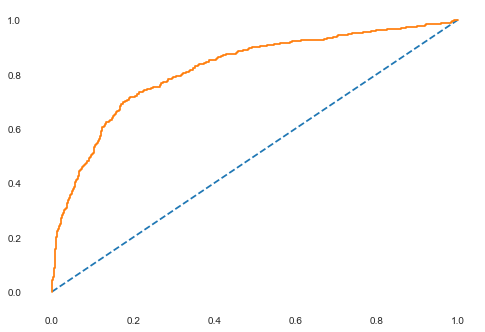

In [220]:
# predict probabilities
probs = logreg2.predict_proba(x_test)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
LR_Test_Auc = roc_auc_score(y_test, probs)
print('AUC: %.3f' % LR_Test_Auc)
# calculate roc curve
LR_test_fpr, LR_test_tpr, LR_test_thresholds = roc_curve(y_test, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(LR_test_fpr, LR_test_tpr);

In [221]:
confusion_matrix(y_train, ytrain_predict)

array([[5239, 1161],
       [1096, 5304]], dtype=int64)

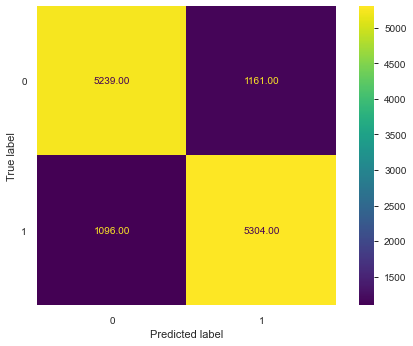

In [222]:
plot_confusion_matrix(logreg_cv,x_train,y_train,values_format='0.2f');

In [223]:
print(classification_report(y_train , ytrain_predict))

              precision    recall  f1-score   support

           0       0.83      0.82      0.82      6400
           1       0.82      0.83      0.82      6400

    accuracy                           0.82     12800
   macro avg       0.82      0.82      0.82     12800
weighted avg       0.82      0.82      0.82     12800



In [224]:
LR = classification_report(y_train,ytrain_predict,output_dict=True)
df = pd.DataFrame(LR).transpose()
df
LR_Train_precision = round(df.loc["1"][0],2)
LR_Train_recall = round(df.loc["1"][1],2)
LR_Train_f1 = round(df.loc["1"][2],2)
print ('LR_Train_precision ',LR_Train_precision)
print ('LR_Train_recall ',LR_Train_recall)
print ('LR_Train_f1 ',LR_Train_f1)

LR_Train_precision  0.82
LR_Train_recall  0.83
LR_Train_f1  0.82


In [225]:
confusion_matrix(y_test, ytest_predict)

array([[2305,  440],
       [ 187,  367]], dtype=int64)

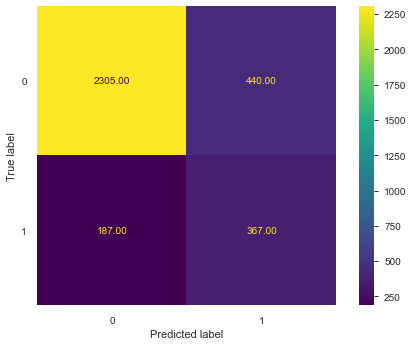

In [226]:
plot_confusion_matrix(logreg2,x_test,y_test, values_format='.2f');

In [227]:
print(classification_report(y_test, ytest_predict))

              precision    recall  f1-score   support

           0       0.92      0.84      0.88      2745
           1       0.45      0.66      0.54       554

    accuracy                           0.81      3299
   macro avg       0.69      0.75      0.71      3299
weighted avg       0.85      0.81      0.82      3299



In [228]:
LR = classification_report(y_test,ytest_predict,output_dict=True)
df = pd.DataFrame(LR).transpose()
df
LR_Test_precision = round(df.loc["1"][0],2)
LR_Test_recall = round(df.loc["1"][1],2)
LR_Test_f1 = round(df.loc["1"][2],2)
print ('LR_Test_precision ',LR_Test_precision)
print ('LR_Test_recall ',LR_Test_recall)
print ('LR_Test_f1 ',LR_Test_f1)

LR_Test_precision  0.45
LR_Test_recall  0.66
LR_Test_f1  0.54


#### Artificial Neural Network

In [229]:
from sklearn.preprocessing import StandardScaler 
sc = StandardScaler() 
X_trains = sc.fit_transform(x_train) 
X_tests = sc.transform (x_test)

In [230]:
param_grid = {
    'hidden_layer_sizes': [(100,100,100)],
    'activation': ['logistic', 'relu'],
    'solver': ['sgd', 'adam'],
    'tol': [0.1,0.01],
    'max_iter' : [10000]
}

mlp = MLPClassifier()

grid_search = GridSearchCV(estimator = mlp, param_grid = param_grid, cv = 3)

In [ ]:
grid_search.fit(x_train, y_train)

In [ ]:
grid_search.best_params_

In [ ]:
best_grid = grid_search.best_estimator_

In [ ]:
ytrain_predict = best_grid.predict(x_train)
ytest_predict = best_grid.predict(x_test)

In [ ]:
ANN_Train_Acc = best_grid.score(x_train, y_train)
ANN_Train_Acc

In [ ]:
ANN_Test_Acc = best_grid.score(x_test, y_test)
ANN_Test_Acc

In [ ]:
# predict probabilities
probs = logreg2.predict_proba(x_train)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
ANN_Train_Auc = roc_auc_score(y_train, probs)
print('AUC: %.3f' % ANN_Train_Auc)
# calculate roc curve
ANN_train_fpr, ANN_train_tpr, ANN_train_thresholds = roc_curve(y_train, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(ANN_train_fpr, ANN_train_tpr);

In [ ]:
# predict probabilities
probs = best_grid.predict_proba(x_test)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
ANN_Test_Auc = roc_auc_score(y_test, probs)
print('AUC: %.3f' % ANN_Test_Auc)
# calculate roc curve
ANN_test_fpr, ANN_test_tpr, ANN_test_thresholds = roc_curve(y_test, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(ANN_test_fpr, ANN_test_tpr);

In [ ]:
print(classification_report(y_train , ytrain_predict))

In [ ]:
print(classification_report(y_test , ytest_predict))

In [ ]:
plot_confusion_matrix(best_grid,x_train,y_train, values_format='.2f');

In [ ]:
plot_confusion_matrix(best_grid,x_test,y_test, values_format='.2f');

In [ ]:
ANN = classification_report(y_train,ytrain_predict,output_dict=True)
df = pd.DataFrame(ANN).transpose()
df
ANN_train_precision = round(df.loc["1"][0],2)
ANN_train_recall = round(df.loc["1"][1],2)
ANN_train_f1 = round(df.loc["1"][2],2)
print ('ANN_train_precision ',ANN_train_precision)
print ('ANN_train_recall ',ANN_train_recall)
print ('ANN_train_f1 ',ANN_train_f1)

In [ ]:
ANN = classification_report(y_test,ytest_predict,output_dict=True)
df = pd.DataFrame(ANN).transpose()
df
ANN_Test_precision = round(df.loc["1"][0],2)
ANN_Test_recall = round(df.loc["1"][1],2)
ANN_Test_f1 = round(df.loc["1"][2],2)
print ('ANN_Test_precision ',ANN_Test_precision)
print ('ANN_Test_recall ',ANN_Test_recall)
print ('ANN_Test_f1 ',ANN_Test_f1)

In [ ]:
print('Comparison of Models : Train set')
index=['Accuracy', 'AUC','Precision','Recall','F1 Score']
data = pd.DataFrame({'LR':[LR_Train_Acc,LR_Train_Auc, LR_Train_precision,LR_Train_recall,LR_Train_f1],
       'KNN':[KNN_Train_Acc,KNN_Train_Auc,KNN_Train_precision,KNN_Train_recall,KNN_Train_f1],
        'CART':[CART_Train_Acc,CART_Train_Auc,CART_Train_precision,CART_Train_recall,CART_Train_f1],
       'NB':[NB_Train_Acc,NB_Train_Auc,NB_Train_precision,NB_Train_recall,NB_Train_f1],
        'RANDOM FOREST':[RFCL_Train_Acc, RFCL_Train_auc, RFCL_Train_precision,RFCL_Train_recall,RFCL_Train_f1],
        'BAGGING':[BG_Train_Acc, BG_Train_auc, BG_Train_precision,BG_Train_recall,BG_Train_f1],
        'ADABOOSTING':[BS_Train_Acc, BS_Train_auc, BS_Train_precision,BS_Train_recall,BS_Train_f1],
        'GRADIENT BOOSTING':[GBS_Train_Acc, GBS_Train_auc, GBS_Train_precision,GBS_Train_recall,GBS_Train_f1],
        'ANN':[ANN_Train_Acc, ANN_Train_Auc, ANN_train_precision,ANN_train_recall,ANN_train_f1]},index=index)
round(data,2)

In [ ]:
print('Comparison of Models : Test set')
index=['Accuracy', 'AUC','Precision','Recall','F1 Score']
data = pd.DataFrame({'LR':[LR_Test_Acc,LR_Test_Auc, LR_Test_precision,LR_Test_recall,LR_Test_f1],
       'KNN':[KNN_Test_Acc,KNN_Test_Auc,KNN_Test_precision,KNN_Test_recall,KNN_Test_f1],
        'CART':[CART_Test_Acc,CART_Test_Auc,CART_Test_precision,CART_Test_recall,CART_Test_f1],
       'NB':[NB_Test_Acc,NB_Test_Auc,NB_Test_precision,NB_Test_recall,NB_Test_f1],
        'RANDOM FOREST':[RFCL_Test_Acc, RFCL_Test_auc, RFCL_Test_precision,RFCL_Test_recall,RFCL_Test_f1],
        'BAGGING':[BG_Test_Acc, BG_Test_Auc, BG_Test_precision,BG_Test_recall,BG_Test_f1],
        'ADABOOSTING':[BS_Test_Acc, BS_Test_Auc, BS_Test_precision,BS_Test_recall,BS_Test_f1],
        'GRADIENT BOOSTING':[GBS_Test_Acc, GBS_Test_Auc, GBS_Test_precision,GBS_Test_recall,GBS_Test_f1],
        'ANN':[ANN_Test_Acc, ANN_Test_Auc, ANN_Test_precision,ANN_Test_recall,ANN_Test_f1]},index=index)
round(data,2)

In [ ]:
plt.plot([0, 1], [0, 1], linestyle='--')
plt.plot(LR_train_fpr, LR_train_tpr,color='black',label="Logistic Regression")
plt.plot(RFCL_train_fpr,RFCL_train_tpr,color='green',label="Random Forest")
plt.plot(CART_train_fpr, CART_train_tpr,color='blue',label="Decision Tree")
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC')
plt.legend(bbox_to_anchor=(0., 1.02, 1., .102), loc='lower right')

In [ ]:
plt.plot([0, 1], [0, 1], linestyle='--')
plt.plot(NB_train_fpr,NB_train_tpr,color='cyan',label="Naive Bayes")
plt.plot(KNN_train_fpr, KNN_train_tpr,color='yellow',label="K-abclNearest Neighbors")
plt.plot(BG_train_fpr,BG_train_tpr,color='black',label="Bagging")
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC')
plt.legend(bbox_to_anchor=(0., 1.02, 1., .102), loc='lower right')

In [ ]:
plt.plot([0, 1], [0, 1], linestyle='--')
plt.plot(BS_train_fpr, BS_train_tpr,color='cyan',label="Ada Boosting")
plt.plot(GBS_train_fpr,GBS_train_tpr,color='magenta',label="Gradient Boosting")
plt.plot(ANN_train_fpr, ANN_train_tpr,color='red',label="Artificial Neural Network")
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC')
plt.legend(bbox_to_anchor=(0., 1.02, 1., .102), loc='lower right')

In [ ]:
plt.plot([0, 1], [0, 1], linestyle='--')
plt.plot(RFCL_train_fpr,RFCL_train_tpr,color='green',label="Random Forest")
plt.plot(CART_train_fpr, CART_train_tpr,color='blue',label="Decision Tree")
plt.plot(GBS_train_fpr,GBS_train_tpr,color='magenta',label="Gradient Boosting")
plt.plot(LR_train_fpr, LR_train_tpr,color='black',label="Logistic Regression")
plt.plot(ANN_train_fpr, ANN_train_tpr,color='yellow',label="Artificial Neural Network")
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC')
plt.legend(bbox_to_anchor=(0., 1.02, 1., .102), loc='lower right')